<center><img src = https://w7.pngwing.com/pngs/479/813/png-transparent-police-officer-robbery-crime-police-police-officer-people-cartoon.png width = '300' <center>

## <center> Crimes in Boston <center>
### <center>- Gloria Miori -<center>

## Unsupervised ML project process

## Table of Contents

* [A. Introduction](#introduction)
* [B. Importing libraries and define functions](#libraries)
* [C. Importing data](#data)
    * Direct visualization of the data<br>
    <br>
* [2. MLC2: Data understanding and data cleaning](#data_understanding)
    * Dataset size
    * Variable types
    * Duplicates
    * Removing columns<br>
    * General look at the variables and variables´ type<br>
    <br>
    * [2.1. Univariate data analysis and Data Cleaning](#uni_multi_variate_data_analysis)
        * Descriptive statistics
        * Null values and imputation/deleting
        * Variables distribution and analysis
        * Data Cleaning
        <br>
        * [Elimination of redundant features or features I disregarded for now](#feature_elim)<br>
        * [Feature engineering](#feature_eng)<br>
    <br>
 
* [3. MLC3: Data transformation](#data_tranf)
    * [3.1. Data transformation of categorical variables](#transformation_categorical)<br>
    <br>
* [4. Clustering Analysis of Larceny](#cluster_larceny)
    * [Data Scaling](#data_scal)
    * [4.1. K-means algorithm](#kmeans)
    * [4.2. DBSCAN algorithm](#dbscan)
    * [4.3. OPTICS used with DBSCAN cluster method](#optics_dbscan)
    * [4.4. OPTICS](#optics)
    * [4.4. HDBSCAN](#hdbscan)<br>
    <br>
* [5. Clusters evaluation](#clusters_evaluation)<br>
<br>
* [6. Final comments](#final_comments)<br>

## A. Introduction <a class="anchor" id="introduction"></a>

The data provided are crime incident reports provided by Boston Police Department (BPD), documenting the inital details surrounding an incident to which BPD officers respond. This is a dataset containing records from the new crime incident report system, which includes a reduced set of fields focused on capturing the typeof incidents as well as when and where it occured.<br>
<br>
The goal of this project is to help derive some insights from the data provided.<br>
<br>
There are 2 files:<br>
- crime.csv: reporting the actual data where each row in this dataset corresponds to a reported crime <br>
- offense_codes.csv: reporting the map of crime codes to the actual crime type description<br>

## B. Importing libraries and define functions <a class="anchor" id="libraries"></a>

### Python version: 3.8.8
### Libraries versions used:
- numpy version 1.20.1
- pandas version 1.3.4
- matplotlib version 3.3.4
- seaborn version 0.11.1
- sklearn version 1.0.1

In [1]:
import numpy as np
import pandas as pd
from statistics import mode
pd.set_option("display.max_rows", None, "display.max_columns", None)
pd.set_option('display.float_format', lambda x: '%.5f' % x)
from datetime import datetime
import re

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import geopandas as gpd
import folium
from folium.plugins import HeatMap

In [2]:
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler,RobustScaler,StandardScaler

import sklearn.cluster as cluster
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.cluster import cluster_optics_dbscan
from sklearn import metrics

from hdbscan import HDBSCAN

In [3]:
from sklearn import __version__ as pandas_version
print('Installed version for pandas: {}.'.format(pandas_version))

Installed version for pandas: 1.0.2.


In [4]:
#########################################
############### FUNCTIONS ###############
#########################################

### Data analysis and cleaning
def print_summary(feature): # feature within '' ###################### corrected
    print('Number of unique values: ',df[feature].nunique())
    print(df[feature].dtype)
    print(df[feature].value_counts(dropna = False))
    print('Null values',df[feature].isnull().sum())

def plot_cat_var(df,feature, plot_perc = False,add_mean = False, order = True, palette=None, vertical = False): #df = dataframe; feature within '', plot_perc => Boolean, define_color optional must be within ''; add_mean --> Boolean
    plt.figure(figsize=[20,10])
    plt.title('Number of crimes per ' + feature,  fontsize=20)
    if order == True:
        order= df[feature].value_counts().index
        order = order
    else:
        order = None
    if vertical == False:
        ax = sns.countplot(data = df, x= feature, order = order, palette = palette);
        plt.ylabel('Number of crimes', fontsize=16)
        plt.xlabel('')
        total = len(df)
    else:
        ax = sns.countplot(data = df, y= feature, order = order, palette = palette);
        plt.xlabel('Number of crimes', fontsize=16)
        plt.ylabel('')
    total = len(df)
    if plot_perc == True:
        for p in ax.patches:
            percentage = f'{100 * p.get_height() / total:.1f}%\n'
            x = p.get_x() + p.get_width() / 2
            y = p.get_height()
            ax.annotate(percentage, (x, y), rotation=45, annotation_clip=False)
    if add_mean == True:
        ax.axhline(df[feature].value_counts().mean(), 0, label = 'Mean', color = 'red')
        l = plt.legend(loc='upper right')
    return ax

def plot_distr_num_var(feature,nb_bins): # feature within '', nb_bins = for the histogram ###################### corrected
    print(df[feature].describe())
    plt.figure(figsize=[10,5])
    plt.title('Distribution of ' + feature)
    sns.boxplot(data=df, y=feature)
    plt.show()
    plt.figure(figsize=[10,5])
    df[feature].plot(kind='hist', bins = nb_bins)
    plt.figure(figsize=[10,5])
    plt.figure(figsize=[10,5])

def norm_list_values(feature): # feature within ''
    return df[feature].value_counts(normalize=True, dropna=False)*100

def plot_distr_map(df,geo_info, distr_crimes= False): # df --> df to analyse, geo_info: file shp loaded, distr_crimes --> plot distribution of crimes across districts
    geo_info['point'] = geo_info.representative_point() #Returns a GeoSeries of points that are guaranteed to be within each geometry
    label_points = geo_info.copy() # create a copy of geo_info
    label_points.set_geometry('point', inplace = True) # set the district geometry to be the representative point
    if distr_crimes == False:
        ax = geo_info.plot(color = 'lavender', figsize = (30,10), edgecolor = 'black', linewidth = 0.3)
    else:
        geo_info['crimes'] = geo_info.DISTRICT.map(df['district'].value_counts()) # use map function to match each district with its corresponding value
        ax = geo_info.plot(column = geo_info.crimes, cmap = 'OrRd', legend = True, figsize = (30,10), edgecolor = 'black', linewidth = 0.3)
    plt.xlabel("Longitude", fontsize=14)
    plt.ylabel("Latitude", fontsize=14)
    for x, y, label in zip(label_points.geometry.x, label_points.geometry.y, label_points['DISTRICT']): # add the corresponding label DISTRICT that is is inside g_dis 
        plt.text(x, y, label, fontsize = 10, fontweight = 'bold')
    return ax

def plot_over_time(feature):
    plt.figure(figsize=[20,10])
    text = str(feature)
    try:
        found = re.search('<(.+?)>', text).group(1)
    except AttributeError:# <, > not found in the original string
        found = '' # apply your error handling
    feature.sum().plot()
    plt.title('Number of crimes over time - Frequency = ' + found,fontsize=20)
    plt.xlabel('Frequency = ' + found, fontsize=14)
    plt.ylabel("Number of crimes", fontsize=14)

def set_Others(column, num_values): #columns within '', num_values = number of variables to leave as they are
    top_categories = df[column].value_counts().head(num_values)
    top_categories_list = top_categories.index.to_list()
    top_categories_list.append('Others')
    df[column] = pd.Categorical(df[column], categories=top_categories_list)
    return df[column].fillna('Other', inplace=True)

### Data transformation

def frequency_encoding(feature,num_bin): # num_bin for the histogram ################### NOT USED BUT LEFT IF NEEDED
    frequency_encoded = df.groupby(feature).size()/len(df)*100
    feature_fe = feature +'_fe'
    df.loc[:,feature_fe] = df[feature].map(frequency_encoded)
    print(feature + ' frequency encoded analysis')
    plot_distr_num_var(feature_fe,num_bin)
    df.drop(feature, axis = 1, inplace = True)

### Clusters

def plot_clusters(cluster_column): # cluster column in ''
    fig = px.scatter(data, x='long', y='lat', color= data[cluster_column], hover_data=['long', 'lat'])
    fig.update_layout(width=900, height=775)
    fig.update_layout(font_size=14,title_text=cluster_column, title_font_size=20, font_color='black',title_x=0.5)
    fig.show()

def plot_cluster_info(cluster_column): # cluster column in ''
    print(data[cluster_column].describe())
    if data[cluster_column].min() == -1:
        print('Number of clusters= ', data[cluster_column].nunique()-1, ' + the "noise" cluster')
    else:
        print('Number of clusters= ', data[cluster_column].nunique())

def plot_cluster_on_map(cluster_column): # cluster column in ''
    fig = plt.scatter(data.long, data.lat, c = data[cluster_column], s = 10, cmap = 'Paired');
    plt.title(cluster_column);

def plot_cluster_heatmap(cluster_column,cluster_number, radius = 20):
    cluster_nb = data[data[cluster_column] ==cluster_number]
    data_no_c = cluster_nb[['lat','long']]
    mean_lat = data_no_c.mean()[0]
    mean_long = data_no_c.mean()[1]
    my_map=folium.Map(location = [mean_lat,mean_long], #Initiate map on my cluster
                  zoom_start = 15,
                  min_zoom = 11
    )
    HeatMap(data_no_c, radius=radius).add_to(my_map)
    popup_name ='Cluster ' + str(cluster_number)
    folium.Marker([mean_lat, mean_long],
               popup = popup_name).add_to(my_map)

    return my_map

## C. Importing data<a class="anchor" id="data"></a>

In [5]:
codes = pd.read_csv('offense_codes.csv',encoding = 'windows-1252')
codes.reset_index(drop=True, inplace = True)

In [6]:
codes.head(5)

,CODE,NAME
0,612,LARCENY PURSE SNATCH - NO FORCE
1,613,LARCENY SHOPLIFTING
2,615,LARCENY THEFT OF MV PARTS & ACCESSORIES
3,1731,INCEST
4,3111,LICENSE PREMISE VIOLATION


In [7]:
codes.columns = codes.columns.str.lower() # changing the columns name to work more easily

In [8]:
df = pd.read_csv('crime.csv',encoding = 'windows-1252')
df.head(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.35779,-71.13937,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.30682,-71.06030,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.34659,-71.07243,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.33418,-71.07866,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.27537,-71.09036,"(42.27536542, -71.09036101)"


In [9]:
df.columns = df.columns.str.lower() # changing the columns name to work more easily

## MLC2: Data understanding and data cleaning<a class="anchor" id="data_understanding"></a>

Let´s have a general look at the DB.<br>
<br>
The file: offense_codes.csv, I will use it to map consistently the crime code with a crime name.<br>
<br>
I will do the univariate analysis and the data cleaning in one step only, as I go trough the individually.<br>
<br>
Some columns are not of interest and I will delete them.<br>

### Checking for Duplicates:

-  in the offense_codes file

In [10]:
codes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 576 entries, 0 to 575
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   code    576 non-null    int64 
 1   name    576 non-null    object
dtypes: int64(1), object(1)
memory usage: 9.1+ KB


In [11]:
codes.nunique()

code    425
name    479
dtype: int64

In [12]:
codes.duplicated().sum()

83

In [13]:
codes[codes.duplicated(keep = False)].sort_values('code', ascending=True).head(10)

,code,name
154,112,KILLING OF FELON BY POLICE
184,112,KILLING OF FELON BY POLICE
155,114,KILLING OF POLICE BY FELON
185,114,KILLING OF POLICE BY FELON
15,121,MANSLAUGHTER - VEHICLE - NEGLIGENCE
186,121,MANSLAUGHTER - VEHICLE - NEGLIGENCE
188,123,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE
14,123,MANSLAUGHTER - NON-VEHICLE - NEGLIGENCE
329,724,AUTO THEFT
94,724,AUTO THEFT


In [14]:
codes.drop_duplicates(inplace=True)
codes.reset_index(drop=True, inplace = True)

I would say the codes must be unique:

In [15]:
codes.nunique()

code    425
name    479
dtype: int64

But they are not, let´s check why and if we should eliminate these duplicates:

In [16]:
codes[codes.duplicated(['code'], keep = False)].sort_values('code', ascending=True).head(10)

,code,name
183,111,MURDER NON-NEGLIGIENT MANSLAUGHTER
19,111,"MURDER, NON-NEGLIGIENT MANSLAUGHTER"
201,301,ROBBERY - FIREARM - BANK
56,301,ROBBERY - STREET
57,311,ROBBERY - COMMERCIAL
211,311,ROBBERY - KNIFE - CHAIN STORE
58,351,ROBBERY - BANK
243,351,ROBBERY ATTEMPT - KNIFE - CHAIN STORE
59,361,ROBBERY - OTHER
253,361,ROBBERY ATTEMPT - OTHER WEAPON - MISCELLANEOUS


I can delete those duplicates, since it´s just a different way of describing it, some typo, ...<br>
I will keep the last since the DRUG ones are better descibed in the second one.

In [17]:
codes.drop_duplicates(subset= ['code'], inplace=True,keep = 'last')
codes.reset_index(drop=True, inplace = True)
codes.duplicated(['code'], keep = False).any()

False

There is no NaN in this DF and the values are now unique, I don´t have to modify and analyse further this DF since I will just use it to map consistently the offense_description in the data DF

- in the crimes data:

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   incident_number      319073 non-null  object 
 1   offense_code         319073 non-null  int64  
 2   offense_code_group   319073 non-null  object 
 3   offense_description  319073 non-null  object 
 4   district             317308 non-null  object 
 5   reporting_area       319073 non-null  object 
 6   shooting             1019 non-null    object 
 7   occurred_on_date     319073 non-null  object 
 8   year                 319073 non-null  int64  
 9   month                319073 non-null  int64  
 10  day_of_week          319073 non-null  object 
 11  hour                 319073 non-null  int64  
 12  ucr_part             318983 non-null  object 
 13  street               308202 non-null  object 
 14  lat                  299074 non-null  float64
 15  long             

In [19]:
df.duplicated().sum()

23

In [20]:
df.drop_duplicates(inplace=True)
df.reset_index(drop=True, inplace = True)

I would have thought that INCIDENT_NUMBER was a unique identifier of the crimes:

In [21]:
df.incident_number.nunique()

282517

But it is not: I assume the same INCIDENT_NUMBER is because the same person has committed more than 1 crime in the same situation<br>
i.e. a person arrested who has committed simple assault and vandalism at the same time will have the same INCIDENT_NUMBER with difference offence code

The crimes should then be unique for 'INCIDENT_NUMBER' and 'OFFENSE_CODE':

In [22]:
df[df.duplicated(['incident_number','offense_code'], keep = False)].head(10)

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location
82375,I172090479,3115,INVESTIGATE PERSON,INVESTIGATE PERSON,A1,104,NaN,2017-10-29 16:52:00,2017,10,Sunday,16,NaN,WASHINGTON ST,42.35649,-71.05928,"(42.35648631, -71.05928145)"
82376,I172090479,3115,Investigate Person,INVESTIGATE PERSON,A1,104,NaN,2017-10-29 16:52:00,2017,10,Sunday,16,Part Three,WASHINGTON ST,42.35649,-71.05928,"(42.35648631, -71.05928145)"
318722,I152041086-00,2407,Disorderly Conduct,ANNOYING AND ACCOSTING,A1,111,NaN,2015-08-17 13:00:00,2015,8,Monday,13,Part Two,BOYLSTON ST,42.35237,-71.06454,"(42.35236776, -71.06454338)"
318723,I152041086-00,2407,Disorderly Conduct,ANNOYING AND ACCOSTIN,A1,111,NaN,2015-08-17 13:00:00,2015,8,Monday,13,Part Two,BOYLSTON ST,42.35237,-71.06454,"(42.35236776, -71.06454338)"
318750,I152026775-00,3115,Investigate Person,INVESTIGATE PERSON,C6,936,NaN,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,ORTON-MAROTTA WAY,42.33857,-71.05576,"(42.33857289, -71.05575501)"
318751,I152026775-00,3115,INVESTIGATE PERSON,INVESTIGATE PERSON,C6,936,NaN,2015-10-19 16:04:00,2015,10,Monday,16,NaN,ORTON-MAROTTA WAY,42.33857,-71.05576,"(42.33857289, -71.05575501)"
318794,I152000618-00,1503,Firearm Violations,FIREARM/WEAPON - POSSESSION OF DANGEROUS,B2,308,NaN,2015-07-20 18:48:00,2015,7,Monday,18,Part Two,BOWER ST,42.31997,-71.08715,"(42.31996758, -71.08715022)"
318795,I152000618-00,1503,Firearm Violations,"WEAPON - OTHER - CARRYING / POSSESSING, ETC",B2,308,NaN,2015-07-20 18:48:00,2015,7,Monday,18,Part Two,BOWER ST,42.31997,-71.08715,"(42.31996758, -71.08715022)"
318846,I142033219-00,1842,Drug Violation,"DRUGS - POSS CLASS A - HEROIN, ETC.",D4,171,NaN,2016-01-04 17:20:00,2016,1,Monday,17,Part Two,HARRISON AVE,42.33512,-71.07492,"(42.33511904, -71.07491710)"
318847,I142033219-00,1842,Drug Violation,"DRUGS - POSS CLASS A - HEROIN, ETC.",D4,171,NaN,2016-01-04 17:20:00,2016,1,Monday,17,Part Two,HARRISON AVE,42.33512,-71.07492,"(42.33511904, -71.07491710)"


Those values are duplicated: they are the same crime but with a different description in OFFENSE_DESCRIPTION or with a typo<br>
I will delete the duplicates

In [23]:
df.drop_duplicates(subset= ['incident_number','offense_code'], inplace=True)
df.reset_index(drop=True, inplace = True)

In [24]:
df.duplicated(['incident_number','offense_code'], keep = False).any()

False

## General look at the variables

In [25]:
# summary of numerical ones
df.describe(include='number')

,offense_code,year,month,hour,lat,long
count,319037.00000,319037.00000,319037.00000,319037.00000,299039.00000,299039.00000
mean,2317.53625,2016.56072,6.60960,13.11812,42.21437,-70.90825
std,1185.31051,0.99630,3.27364,6.29428,2.15989,3.49382
min,111.00000,2015.00000,1.00000,0.00000,-1.00000,-71.17867
25%,1001.00000,2016.00000,4.00000,9.00000,42.29742,-71.09713
50%,2907.00000,2017.00000,7.00000,14.00000,42.32554,-71.07752
75%,3201.00000,2017.00000,9.00000,18.00000,42.34862,-71.06247
max,3831.00000,2018.00000,12.00000,23.00000,42.39504,-1.00000


offense_code is a numerical variable, but in reality it should be categorical (ordinality has no meaning for this variable)

In [26]:
# summary of categorical ones
df.describe(include=['object']).T

,count,unique,top,freq
incident_number,319037,282517,I162030584,13
offense_code_group,319037,67,Motor Vehicle Accident Response,37132
offense_description,319037,241,SICK/INJURED/MEDICAL - PERSON,18783
district,317272,12,B2,49939
reporting_area,319037,879,,20250
shooting,1019,1,Y,1019
occurred_on_date,319037,233229,2017-06-01 00:00:00,29
day_of_week,319037,7,Friday,48488
ucr_part,318948,4,Part Three,158534
street,308166,4657,WASHINGTON ST,14191


In [27]:
df.isnull().sum()

incident_number             0
offense_code                0
offense_code_group          0
offense_description         0
district                 1765
reporting_area              0
shooting               318018
occurred_on_date            0
year                        0
month                       0
day_of_week                 0
hour                        0
ucr_part                   89
street                  10871
lat                     19998
long                    19998
location                    0
dtype: int64

I check the correlation map between numeric variables at the beginning, to see if there is some correlation<br>

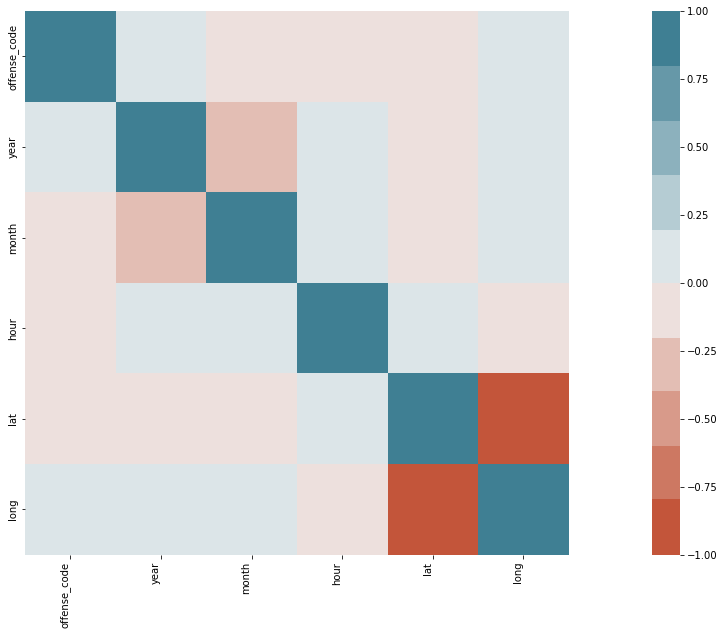

In [28]:
corr = df.corr()
plt.figure(figsize=[30,10])
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=10), square = True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);

It seems not, lat and long seems correlated but by the meaning of them we know they are indipendent and I need both to identify a location point

Let´s have a look at the columns to analyse in the univariate analysis

In [29]:
df.columns

Index(['incident_number', 'offense_code', 'offense_code_group',
       'offense_description', 'district', 'reporting_area', 'shooting',
       'occurred_on_date', 'year', 'month', 'day_of_week', 'hour', 'ucr_part',
       'street', 'lat', 'long', 'location'],
      dtype='object')

## 2.1. Univariate data analysis and Data Cleaning<a class="anchor" id="uni_multi_variate_data_analysis"></a>

In [30]:
# 1) incident_number --> not a feature, no further analysis

In [31]:
# 2) offense_code

print_summary('offense_code')

Number of unique values:  222
int64
3006    18783
3115    18749
3831    16323
1402    15153
802     14797
3301    13099
3410    11287
3114    11124
617      9073
2647     9042
614      8894
3201     8893
3125     8392
613      7952
3802     6557
619      5970
3803     5131
413      4887
1102     4414
3502     4365
2629     4007
3501     3766
3207     3698
724      3629
2610     3252
1106     3147
301      3056
3801     2925
423      2911
2900     2894
2907     2616
1849     2589
520      2585
3109     2559
522      2358
616      2268
1843     2109
1810     1991
2905     1963
615      1951
3111     1701
3820     1656
1842     1518
1001     1452
3018     1405
2405     1397
3007     1347
2007     1338
1841     1328
3830     1286
1874     1274
3108     1269
3001     1215
1830     1205
1107     1065
735      1051
2906     1051
1300     1001
2662      981
3112      968
3130      966
801       962
3810      916
540       914
3106      912
1501      900
1845      897
1848      887
3208      85

In [32]:
norm_list_values('offense_code')

3006   5.88740
3115   5.87675
3831   5.11633
1402   4.74961
802    4.63802
3301   4.10579
3410   3.53783
3114   3.48674
617    2.84387
2647   2.83415
614    2.78776
3201   2.78745
3125   2.63042
613    2.49250
3802   2.05525
619    1.87126
3803   1.60828
413    1.53180
1102   1.38354
3502   1.36818
2629   1.25597
3501   1.18043
3207   1.15911
724    1.13749
2610   1.01932
1106   0.98641
301    0.95788
3801   0.91682
423    0.91243
2900   0.90710
2907   0.81997
1849   0.81150
520    0.81025
3109   0.80210
522    0.73910
616    0.71089
1843   0.66105
1810   0.62407
2905   0.61529
615    0.61153
3111   0.53317
3820   0.51906
1842   0.47581
1001   0.45512
3018   0.44039
2405   0.43788
3007   0.42221
2007   0.41939
1841   0.41625
3830   0.40309
1874   0.39933
3108   0.39776
3001   0.38083
1830   0.37770
1107   0.33382
735    0.32943
2906   0.32943
1300   0.31376
2662   0.30749
3112   0.30341
3130   0.30279
801    0.30153
3810   0.28711
540    0.28649
3106   0.28586
1501   0.28210
1845   0.2

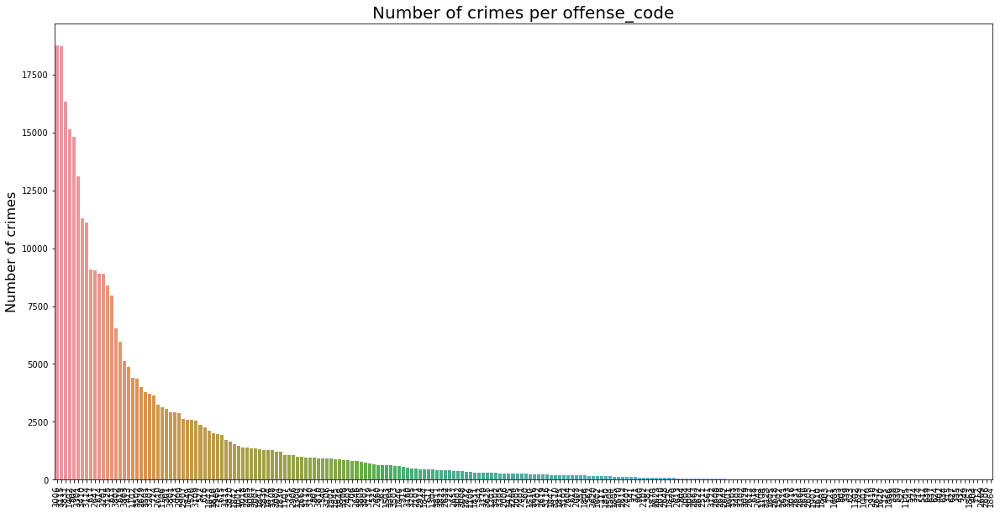

In [33]:
ax = plot_cat_var(df,'offense_code')
plt.xticks(rotation=90);

I will not consider further this variable: it has a high cardinality and similar but more generalized info is in the offense_code_group<br>
I will delete this feature

In [34]:
# 3) offense_code_group
print_summary('offense_code_group')

Number of unique values:  67
object
Motor Vehicle Accident Response              37132
Larceny                                      25933
Medical Assistance                           23540
Investigate Person                           18746
Other                                        18073
Drug Violation                               16544
Simple Assault                               15824
Vandalism                                    15414
Verbal Disputes                              13099
Towed                                        11287
Investigate Property                         11124
Larceny From Motor Vehicle                   10847
Property Lost                                 9751
Warrant Arrests                               8392
Aggravated Assault                            7807
Violations                                    6095
Fraud                                         5829
Residential Burglary                          5605
Missing Person Located                        

In [35]:
norm_list_values('offense_code_group')

Motor Vehicle Accident Response             11.63878
Larceny                                      8.12852
Medical Assistance                           7.37845
Investigate Person                           5.87581
Other                                        5.66486
Drug Violation                               5.18561
Simple Assault                               4.95993
Vandalism                                    4.83141
Verbal Disputes                              4.10579
Towed                                        3.53783
Investigate Property                         3.48674
Larceny From Motor Vehicle                   3.39992
Property Lost                                3.05639
Warrant Arrests                              2.63042
Aggravated Assault                           2.44705
Violations                                   1.91044
Fraud                                        1.82706
Residential Burglary                         1.75685
Missing Person Located                       1

Some names are not correct (last ones) and can be included in other catheogories:
- INVESTIGATE PERSON --> Investigate Person
- Burglary - No Property Taken --> I will include it in Other Burglary
- HOME INVASION --> Residential Burglary

- HUMAN TRAFFICKING and HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE --> rename them capitalized for consistancy

In [36]:
df.offense_code_group.loc[df['offense_code_group'] == 'HOME INVASION'] = 'Residential Burglary'
df.offense_code_group.loc[df['offense_code_group'] == 'INVESTIGATE PERSON'] = 'Investigate Person'
df.offense_code_group.loc[df['offense_code_group'] == 'Burglary - No Property Taken'] = 'Other Burglary'
df.offense_code_group.loc[df['offense_code_group'] == 'HUMAN TRAFFICKING'] = 'Human Traffiking'
df.offense_code_group.loc[df['offense_code_group'] == 'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE'] = 'Human Traffiking - Involuntary Servitude'

C:\Users\glomio\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


This variable is very interesting, giving info on what type of crime are the most popular in Boston

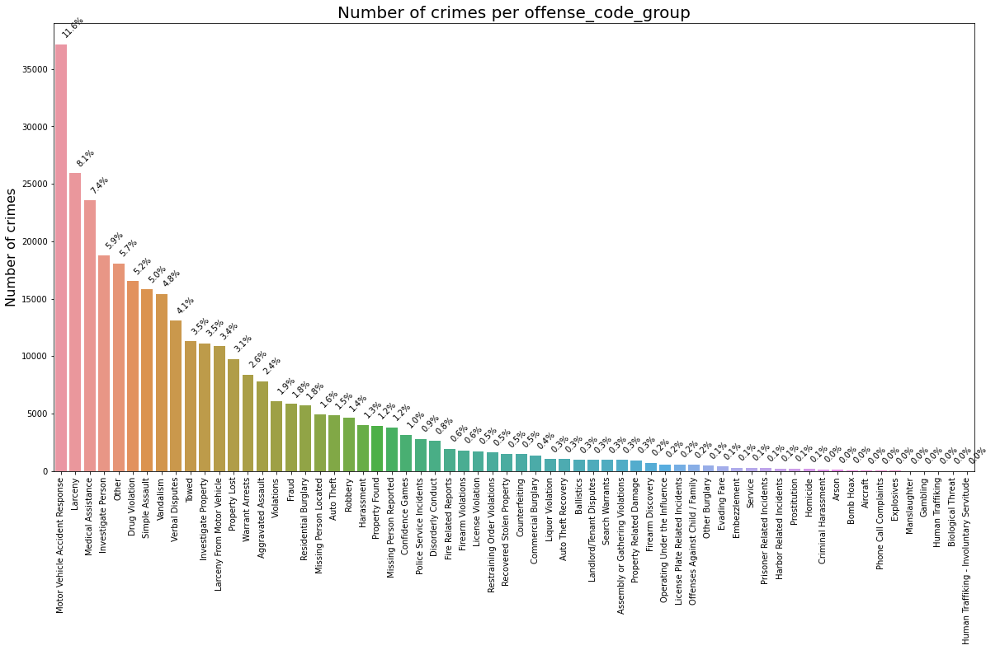

In [37]:
ax = plot_cat_var(df,'offense_code_group', plot_perc = True)
plt.xticks(rotation=90);

In [38]:
#set_Others('offense_code_group',24) #not used
#df.offense_code_group.loc[df['offense_code_group'] == 'Other'] = 'Others' # not used

In [39]:
# 4) offence_description

Offence_code and offence_description had the same information in a different format.<br>
Not investigated further, and as offence_code, I won´t use it.<br>

Before proceeding I will fix columns lat and long, since I need them fixed to be able to correclty plot crimes in the different districts in a map

In [40]:
# 15) lat
norm_list_values('lat')

NaN        6.26824
42.34862   0.38961
42.36184   0.37864
42.28483   0.35137
42.32866   0.32661
42.25622   0.28147
42.29756   0.24543
42.34129   0.24229
-1.00000   0.23352
42.33152   0.23038
42.35231   0.21565
42.33954   0.20531
42.32697   0.20437
42.35512   0.18305
42.30972   0.17960
42.29849   0.17616
42.33402   0.17584
42.33368   0.17239
42.35096   0.16393
42.31043   0.16393
42.35242   0.16111
42.37082   0.15892
42.33429   0.15798
42.32697   0.14795
42.34980   0.14795
42.33512   0.14230
42.35038   0.13948
42.34654   0.13917
42.36644   0.13792
42.28709   0.13729
42.35602   0.13666
42.34841   0.13541
42.34906   0.13384
42.33556   0.13196
42.33506   0.13071
42.36240   0.12538
42.34303   0.12318
42.35522   0.11848
42.34490   0.11785
42.34997   0.11785
42.32810   0.11629
42.32469   0.11284
42.37663   0.11127
42.34797   0.10688
42.29604   0.10626
42.35541   0.10218
42.34946   0.10030
42.35273   0.09811
42.37620   0.09717
42.34943   0.09372
42.32554   0.09341
42.33311   0.09341
42.33211   0

In [41]:
norm_list_values('lat')

NaN        6.26824
42.34862   0.38961
42.36184   0.37864
42.28483   0.35137
42.32866   0.32661
42.25622   0.28147
42.29756   0.24543
42.34129   0.24229
-1.00000   0.23352
42.33152   0.23038
42.35231   0.21565
42.33954   0.20531
42.32697   0.20437
42.35512   0.18305
42.30972   0.17960
42.29849   0.17616
42.33402   0.17584
42.33368   0.17239
42.35096   0.16393
42.31043   0.16393
42.35242   0.16111
42.37082   0.15892
42.33429   0.15798
42.32697   0.14795
42.34980   0.14795
42.33512   0.14230
42.35038   0.13948
42.34654   0.13917
42.36644   0.13792
42.28709   0.13729
42.35602   0.13666
42.34841   0.13541
42.34906   0.13384
42.33556   0.13196
42.33506   0.13071
42.36240   0.12538
42.34303   0.12318
42.35522   0.11848
42.34490   0.11785
42.34997   0.11785
42.32810   0.11629
42.32469   0.11284
42.37663   0.11127
42.34797   0.10688
42.29604   0.10626
42.35541   0.10218
42.34946   0.10030
42.35273   0.09811
42.37620   0.09717
42.34943   0.09372
42.32554   0.09341
42.33311   0.09341
42.33211   0

A 6.2% of values are NaN.<br>
In this case I don´t fill comfortable in imputing them with mean or median, since the variable distribution would change and would have a big pick in the median/mean value (verified).<br>
So I will remove those rows.

In [42]:
df.dropna(subset= ["lat"], how ="any", inplace =True)
df.reset_index(drop=True, inplace = True)

count   299039.00000
mean        42.21437
std          2.15989
min         -1.00000
25%         42.29742
50%         42.32554
75%         42.34862
max         42.39504
Name: lat, dtype: float64


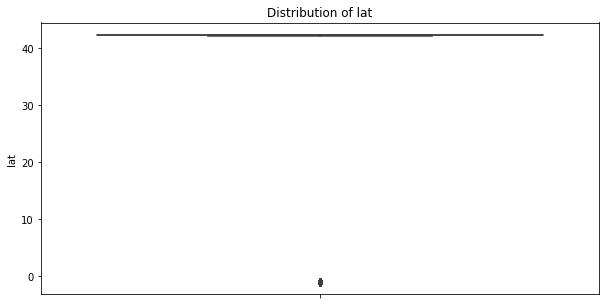

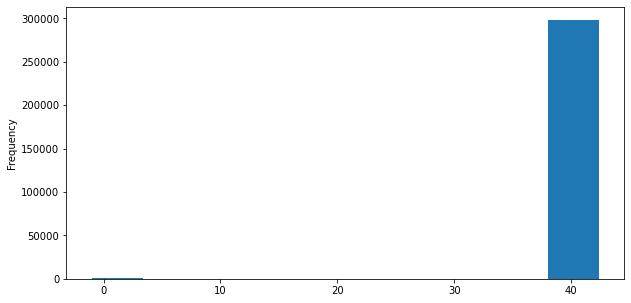

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

In [43]:
plot_distr_num_var('lat', 10)

Outliers are clearly nonsense, so I will delete them.

In [44]:
df = df.drop(df[df.lat < 30].index)
df.reset_index(drop=True, inplace = True)

count   298294.00000
mean        42.32230
std          0.03188
min         42.23241
25%         42.29756
50%         42.32561
75%         42.34862
max         42.39504
Name: lat, dtype: float64


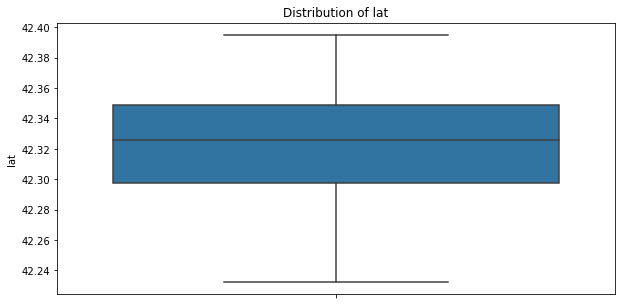

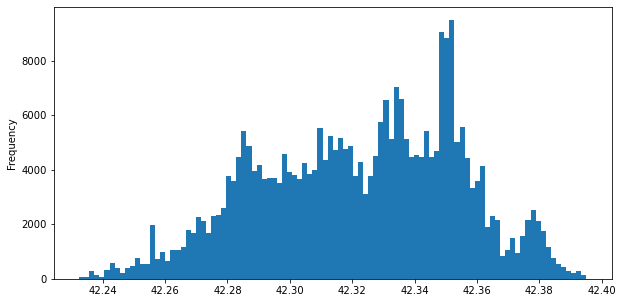

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

In [45]:
plot_distr_num_var('lat', 100)

The distribution is not skewed

In [46]:
# 16) long

print_summary('long')

Number of unique values:  18177
float64
-71.08278    1243
-71.05976    1208
-71.09137    1121
-71.08563    1042
-71.12402     898
-71.05971     783
-71.05468     773
-71.07085     735
-71.06371     688
-71.06941     655
-71.06199     652
-71.06088     584
-71.10429     573
-71.06313     562
-71.07638     561
-71.09188     550
-71.06134     523
-71.07413     523
-71.06525     514
-71.03929     507
-71.07240     504
-71.07841     472
-71.08052     472
-71.07492     454
-71.07626     445
-71.09881     444
-71.06135     440
-71.14822     438
-71.06178     436
-71.08688     432
-71.15050     427
-71.07436     421
-71.09317     417
-71.06955     400
-71.06494     393
-71.06013     378
-71.09659     376
-71.06349     376
-71.06322     371
-71.10088     360
-71.05593     355
-71.07850     341
-71.07717     339
-71.06312     326
-71.14270     320
-71.06256     313
-71.03980     310
-71.06537     299
-71.07276     298
-71.06580     298
-71.07014     297
-71.10378     296
-71.08015     293
-71.10

No null values, since the same NaN we deleted in lat were the same as in long

count   298294.00000
mean       -71.08285
std          0.02977
min        -71.17867
25%        -71.09719
50%        -71.07756
75%        -71.06256
max        -70.96368
Name: long, dtype: float64


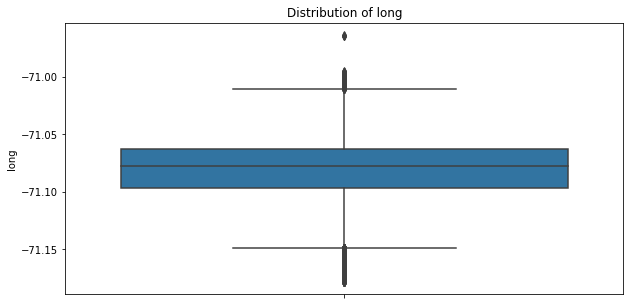

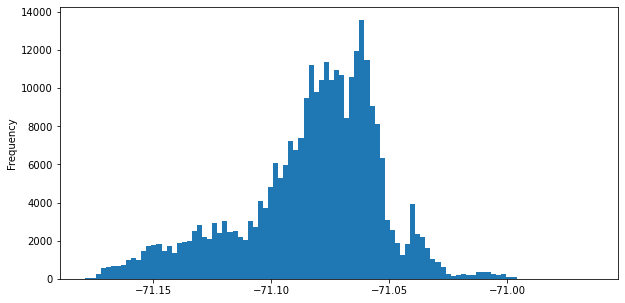

<Figure size 720x360 with 0 Axes>

<Figure size 720x360 with 0 Axes>

In [47]:
plot_distr_num_var('long', 100)

Extreme outliers have been removed by removing the outliers in lat.<br>
The outliers we see now are reasonable outliers, so I will keep them.<br>
The distribution is not skewed

In [48]:
# 5) district

print_summary('district')

Number of unique values:  12
object
B2     46195
C11    40865
D4     38389
B3     33695
A1     32273
C6     21690
D14    19115
E18    16639
E13    16596
A7     13019
E5     12779
A15     6142
NaN      897
Name: district, dtype: int64
Null values 897


There are some NaN (0.6%)

In [49]:
df[df['district'].isna()].head(5)

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location
15,I182070920,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,NaN,,NaN,2018-09-03 19:43:00,2018,9,Monday,19,Part Three,NaN,42.35287,-71.07383,"(42.35287456, -71.07382970)"
24,I182070906,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,NaN,,NaN,2018-09-03 18:20:00,2018,9,Monday,18,Part Three,NaN,42.28359,-71.05566,"(42.28359328, -71.05565683)"
38,I182070889,1843,Drug Violation,DRUGS - POSS CLASS B - INTENT TO MFR DIST DISP,NaN,,NaN,2018-09-03 18:05:00,2018,9,Monday,18,Part Two,NaN,42.30677,-71.08432,"(42.30676881, -71.08431925)"
39,I182070889,3125,Warrant Arrests,WARRANT ARREST,NaN,,NaN,2018-09-03 18:05:00,2018,9,Monday,18,Part Three,NaN,42.30677,-71.08432,"(42.30676881, -71.08431925)"
40,I182070889,1841,Drug Violation,DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP,NaN,,NaN,2018-09-03 18:05:00,2018,9,Monday,18,Part Two,NaN,42.30677,-71.08432,"(42.30676881, -71.08431925)"


It is a small percentage, I will disregard those rows

In [50]:
df.dropna(subset= ['district'], how ="any", inplace =True)
df.reset_index(drop=True, inplace = True)

In [51]:
norm_list_values('district')

B2    15.53311
C11   13.74089
D4    12.90833
B3    11.32997
A1    10.85182
C6     7.29328
D14    6.42744
E18    5.59488
E13    5.58042
A7     4.37765
E5     4.29695
A15    2.06525
Name: district, dtype: float64

Very interesting variable: info of number of crimes in the different districts

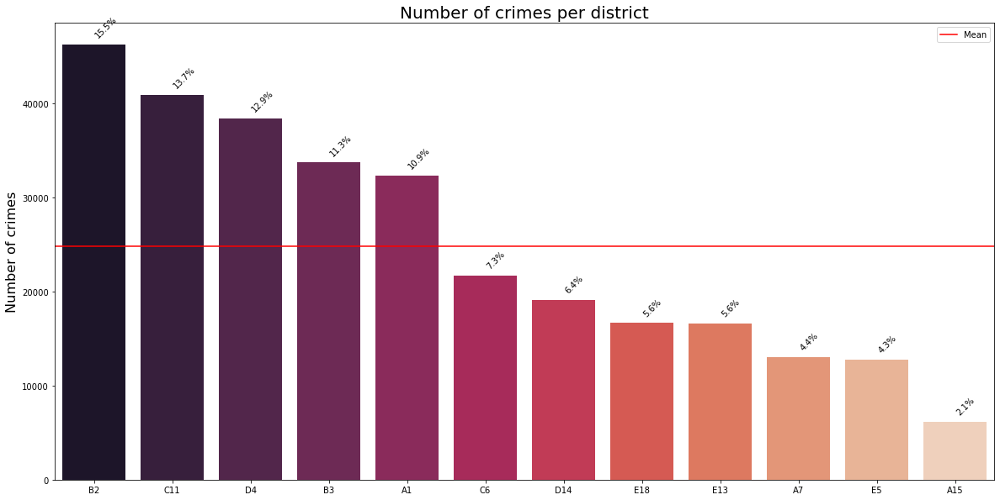

In [52]:
plot_cat_var(df,'district', plot_perc = True, add_mean = True, palette='rocket');

B2, C11, D4, A1 and B3 has the most crimes, above the mean.<br>
District A15 is the district with the lowest crime rate.<br>
Let´s have a spatial visualization of this distribution of crimes

Reading the geographical information on the Boston police districts.<br>
Can be found here: https://bostonopendata-boston.opendata.arcgis.com/datasets/boston::police-districts/about

In [53]:
g_dis = gpd.read_file('Police_Districts.shp')

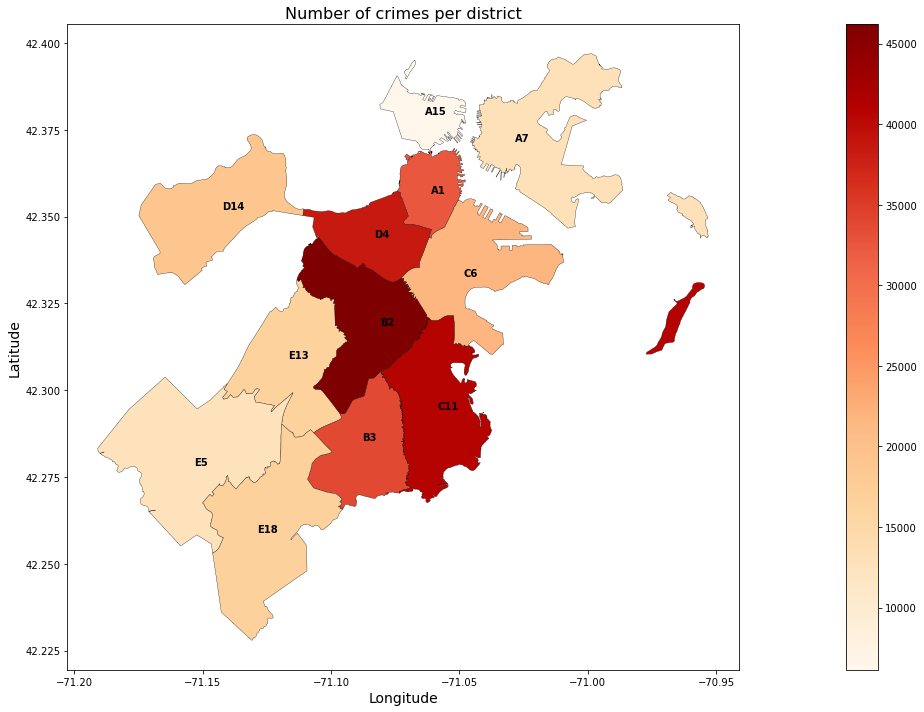

In [54]:
plot_distr_map(df,g_dis, True)
plt.title('Number of crimes per district', fontsize = 16)
plt.tight_layout()

The districts with the highest number of crimes are pointed out in darker red

We can as well see how the crimes are actually distributed over the districts:

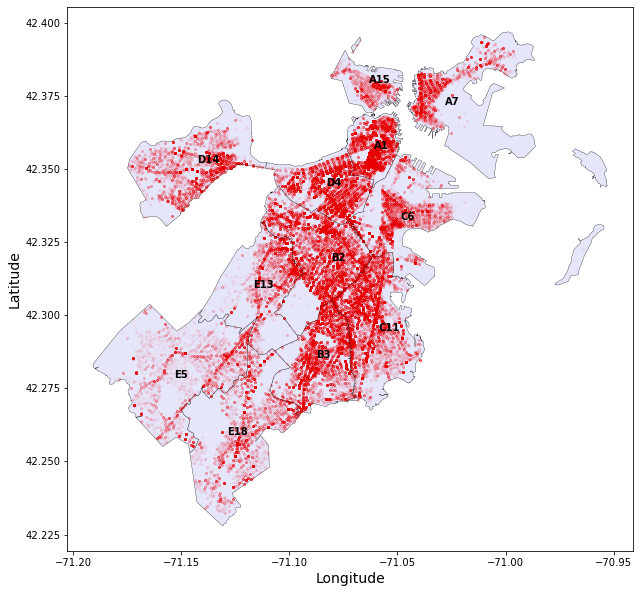

In [55]:
ax = plot_distr_map(df,g_dis)
#sns.jointplot(df.long, df.lat,ax = ax, kind='kde')
plt.scatter(df.long, df.lat, alpha=0.01, color = 'red', s = 5)

In [56]:
# 6) reporting_area
print_summary('reporting_area')

Number of unique values:  878
object
111    2337
329    1868
117    1831
186    1792
143    1775
624    1748
26     1733
465    1591
130    1420
427    1395
134    1388
428    1383
257    1371
177    1359
520    1340
900    1307
914    1291
444    1236
796    1234
304    1216
       1201
112    1176
355    1172
28     1162
102    1159
572    1147
319    1147
282    1143
326    1117
281    1116
273    1097
311    1090
289    1072
171    1063
328    1059
627    1056
330    1049
337    1048
116    1039
915    1030
280    1007
794    1006
170     991
435     990
429     976
357     974
200     973
138     961
402     937
336     931
316     922
77      921
288     915
936     910
332     909
119     905
356     904
167     901
146     891
458     891
476     890
358     890
61      883
822     880
307     867
463     866
165     862
432     860
619     853
450     851
345     848
179     847
105     844
469     842
334     841
94      828
457     823
335     806
466     802
271     792
320

In [57]:
df.sample(5)

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location
9449,I182059681,3207,Property Found,PROPERTY - FOUND,A1,92,NaN,2018-07-28 19:00:00,2018,7,Saturday,19,Part Three,CITY HALL PLZ,42.35972,-71.05852,"(42.35972137, -71.05852360)"
108582,I172053403,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,C11,252,NaN,2017-07-02 21:35:00,2017,7,Sunday,21,Part Three,DENNY ST,42.30901,-71.05108,"(42.30900916, -71.05108100)"
92316,I172072207,413,Aggravated Assault,ASSAULT - AGGRAVATED - BATTERY,C6,936,NaN,2017-08-31 17:20:00,2017,8,Thursday,17,Part One,W SEVENTH ST,42.33751,-71.05582,"(42.33750921, -71.05582443)"
51988,I182010903,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,B2,276,NaN,2018-02-10 17:09:00,2018,2,Saturday,17,Part Three,WASHINGTON ST,42.33185,-71.08182,"(42.33185133, -71.08181888)"
46556,I182017171,3831,Motor Vehicle Accident Response,M/V - LEAVING SCENE - PROPERTY DAMAGE,C6,177,NaN,2018-03-06 11:04:00,2018,3,Tuesday,11,Part Three,MASSACHUSETTS AVE,42.33152,-71.07085,"(42.33152148, -71.07085307)"


In [58]:
norm_list_values('reporting_area')

111   0.78582
329   0.62812
117   0.61568
186   0.60256
143   0.59685
624   0.58777
26    0.58272
465   0.53498
130   0.47748
427   0.46907
134   0.46672
428   0.46503
257   0.46100
177   0.45696
520   0.45058
900   0.43948
914   0.43410
444   0.41561
796   0.41493
304   0.40888
      0.40384
112   0.39543
355   0.39409
28    0.39072
102   0.38971
572   0.38568
319   0.38568
282   0.38433
326   0.37559
281   0.37526
273   0.36887
311   0.36651
289   0.36046
171   0.35743
328   0.35609
627   0.35508
330   0.35273
337   0.35239
116   0.34936
915   0.34634
280   0.33860
794   0.33827
170   0.33322
435   0.33289
429   0.32818
357   0.32751
200   0.32717
138   0.32314
402   0.31507
336   0.31305
316   0.31002
77    0.30969
288   0.30767
936   0.30599
332   0.30565
119   0.30431
356   0.30397
167   0.30296
146   0.29960
458   0.29960
476   0.29926
358   0.29926
61    0.29691
822   0.29590
307   0.29153
463   0.29119
165   0.28985
432   0.28918
619   0.28682
450   0.28615
345   0.28514
179   

This variable has high cardinality and the most frequent value is not defined, so I will disregard this variable.<br>
We already have other variables which gives geographical informations.

In [59]:
# 7) shooting

print_summary('shooting')

Number of unique values:  1
object
NaN    296414
Y         983
Name: shooting, dtype: int64
Null values 296414


NaN are crimes where there was no shooting: I will assign NaN to 0 and Y to 1 so that I have already trasnformed this variable

In [60]:
df.shooting.fillna(0, inplace=True)
df.loc[df.shooting == 'Y', 'shooting'] = 1
df['shooting'] = df['shooting'].astype(int)

In [61]:
print_summary('shooting')

Number of unique values:  2
int32
0    296414
1       983
Name: shooting, dtype: int64
Null values 0


In [62]:
norm_list_values('shooting')

0   99.66947
1    0.33053
Name: shooting, dtype: float64

Most crimes don´t involve a shooting

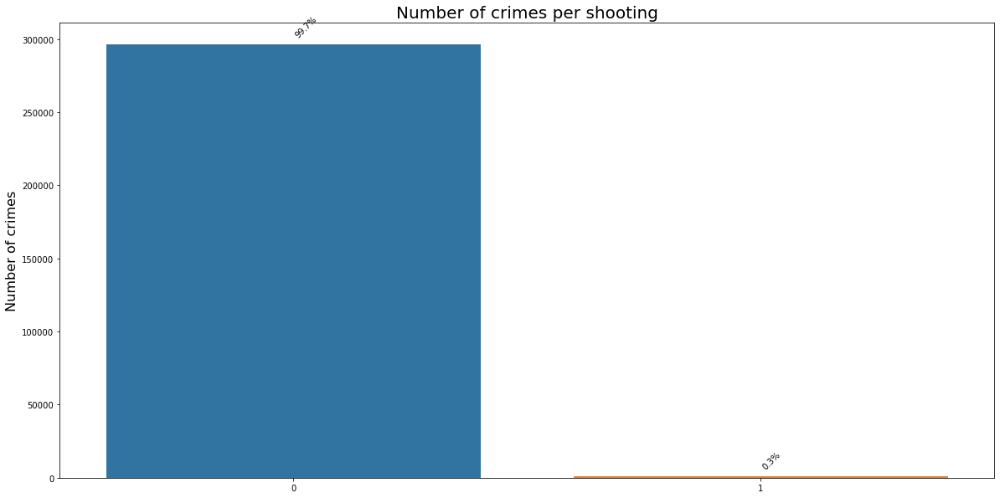

In [63]:
plot_cat_var(df,'shooting', plot_perc = True);

Let´s have a look at where the crimes with shootings happened on the map

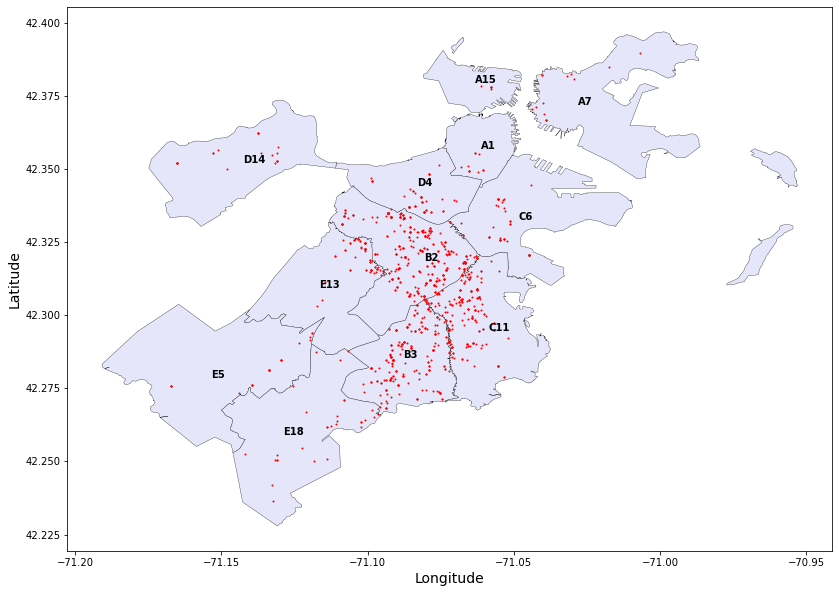

In [64]:
ax = plot_distr_map(df,g_dis)
points3 = gpd.GeoDataFrame(df[df.shooting == 1], geometry=gpd.points_from_xy(df[df.shooting == 1].long, df[df.shooting == 1].lat))
points3.plot(ax=ax,markersize = 1, color = 'red')
plt.show()

The crimes with shooting happened mostly in 3 districts, let´s have a better look at it with frequency plots

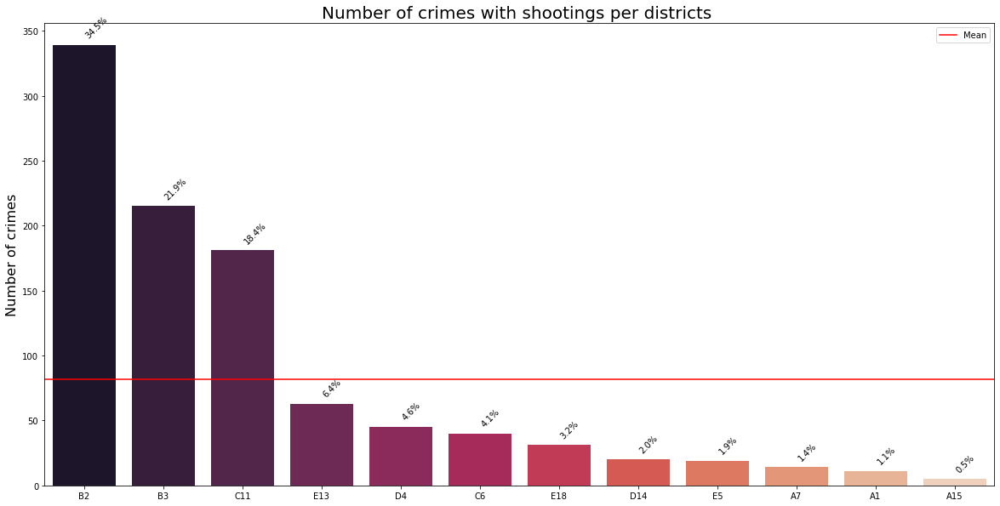

In [65]:
plt.figure(figsize=[20,10])
plt.title('Number of crimes with shootings per districts ',  fontsize=20)
ax = sns.countplot(data = df, x= df['district'][df.shooting == 1], order = df['district'][df.shooting == 1].value_counts().index, palette = 'rocket')
plt.ylabel('Number of crimes', fontsize=16)
plt.xlabel('')
total = len(df[df['shooting'] == 1])
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%\n'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), rotation=45, annotation_clip=False)
ax.axhline(df['district'][df.shooting == 1].value_counts().mean(), 0, label = 'Mean', color = 'red')
l = plt.legend(loc='upper right')

B2, B3, C11 have shootings way above the mean value.<br>
You can notice that districts like D4 which had a high crime rate, but not have many shootings<br>

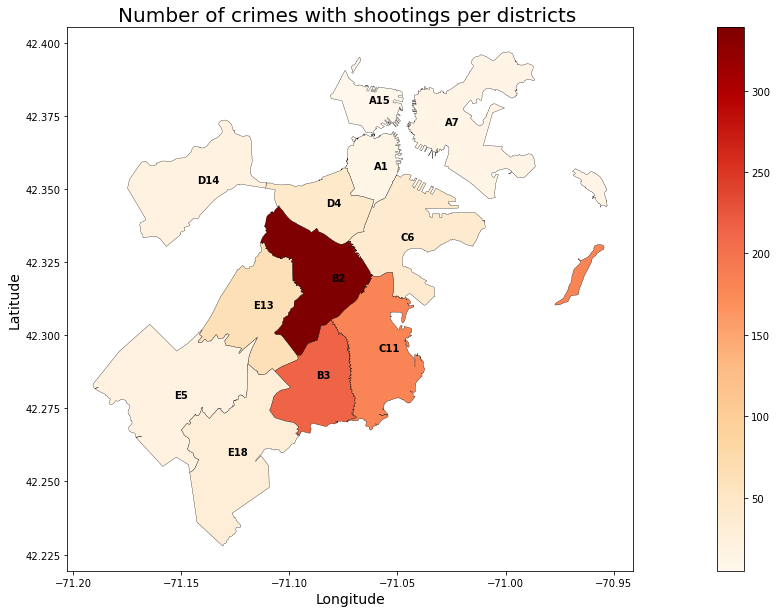

In [66]:
g_dis['point'] = g_dis.representative_point() #Returns a GeoSeries of points that are guaranteed to be within each geometry
label_points = g_dis.copy() # create a copy of geo_info
label_points.set_geometry('point', inplace = True) # set the district geometry to be the representative point
g_dis['shootings'] = g_dis.DISTRICT.map(df['district'][df.shooting == 1].value_counts()) # use map function to match each district with its corresponding value
ax = g_dis.plot(column = g_dis.shootings, cmap = 'OrRd', legend = True, figsize = (30,10), edgecolor = 'black', linewidth = 0.3)
plt.title('Number of crimes with shootings per districts ',  fontsize=20)
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)
for x, y, label in zip(label_points.geometry.x, label_points.geometry.y, label_points['DISTRICT']): # add the corresponding label DISTRICT that is is inside g_dis 
    plt.text(x, y, label, fontsize = 10, fontweight = 'bold')

Most shooting happends in district B2, followed by B3 and C11

In [67]:
# 8) occurred_on_date

In [68]:
df.dtypes

incident_number         object
offense_code             int64
offense_code_group      object
offense_description     object
district                object
reporting_area          object
shooting                 int32
occurred_on_date        object
year                     int64
month                    int64
day_of_week             object
hour                     int64
ucr_part                object
street                  object
lat                    float64
long                   float64
location                object
dtype: object

occurred_on_date is a date, but it is not in the correct format. It is an object, must be converted

In [69]:
df["occurred_on_date"] = pd.to_datetime(df["occurred_on_date"])

In [70]:
df.columns

Index(['incident_number', 'offense_code', 'offense_code_group',
       'offense_description', 'district', 'reporting_area', 'shooting',
       'occurred_on_date', 'year', 'month', 'day_of_week', 'hour', 'ucr_part',
       'street', 'lat', 'long', 'location'],
      dtype='object')

I will not consider this variable since I have already the separate columns year, months, day of the week and hours.<br>
So, I won´t dig much into it.<br>
<br>
I will just have a look at how the crimes goes over time:

In [71]:
df_moment = df['occurred_on_date'].value_counts()

df_day = df_moment.resample('D')
df_week = df_moment.resample('W')
df_month = df_moment.resample('M')

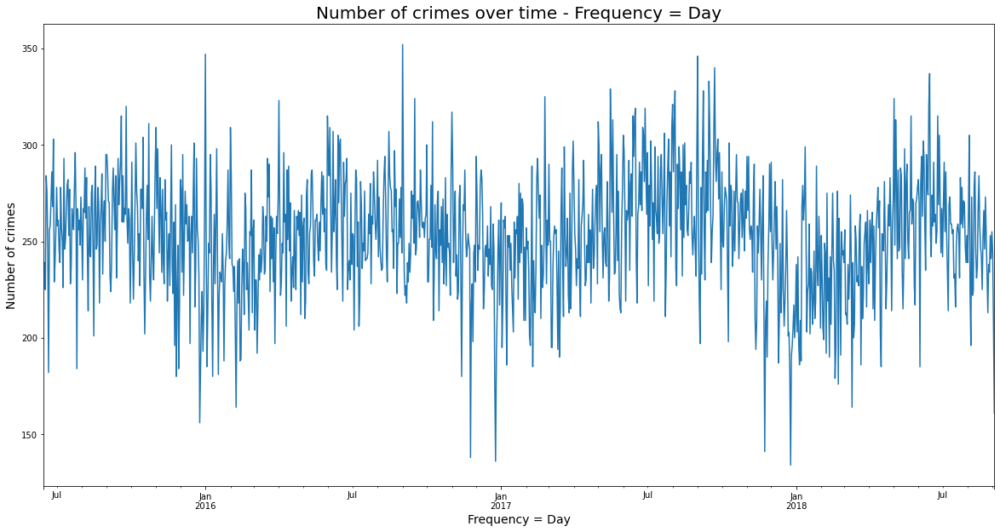

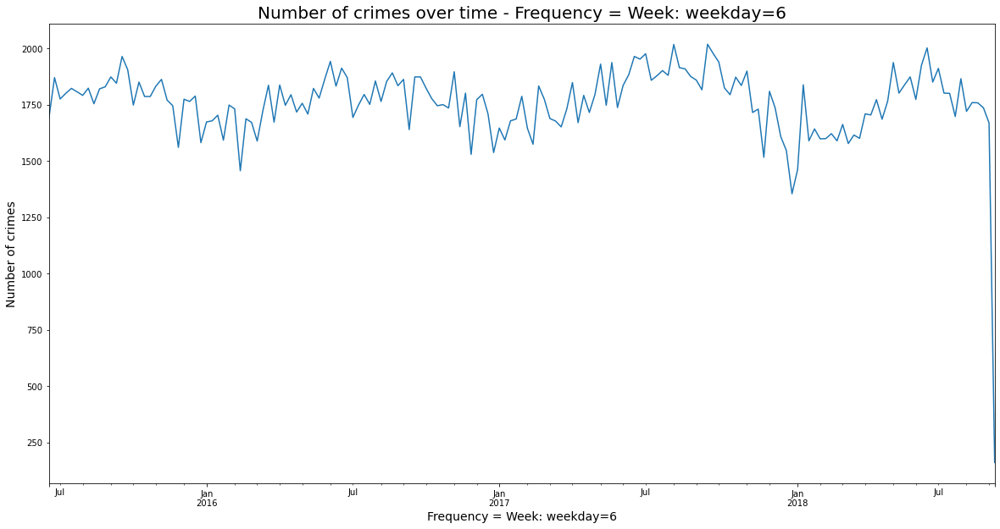

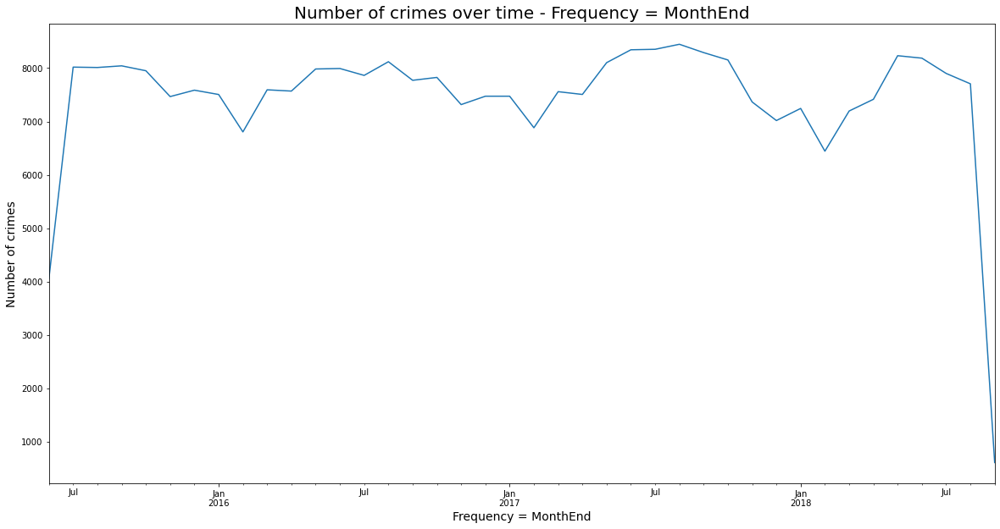

In [72]:
plot_over_time(df_day)
plot_over_time(df_week)
plot_over_time(df_month)

It could be interesting to do a time analysis on this, would think about it if I have time.<br>
I can clearly see a seasonality

This variable could be interesting as well per se, to study the development of different type of crimes over time.<br>
<br>
I.e. Let´s have a look at some common crimes over time

- Residential Burglary

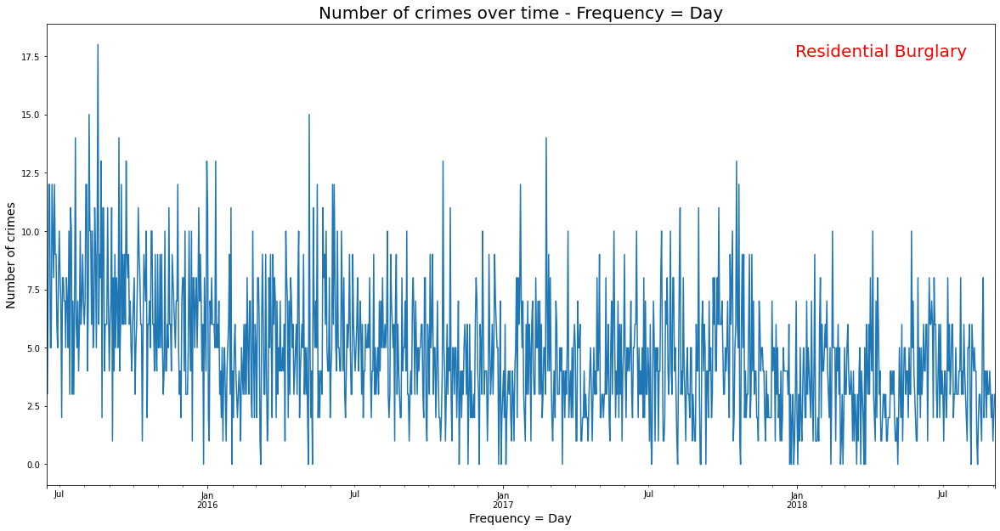

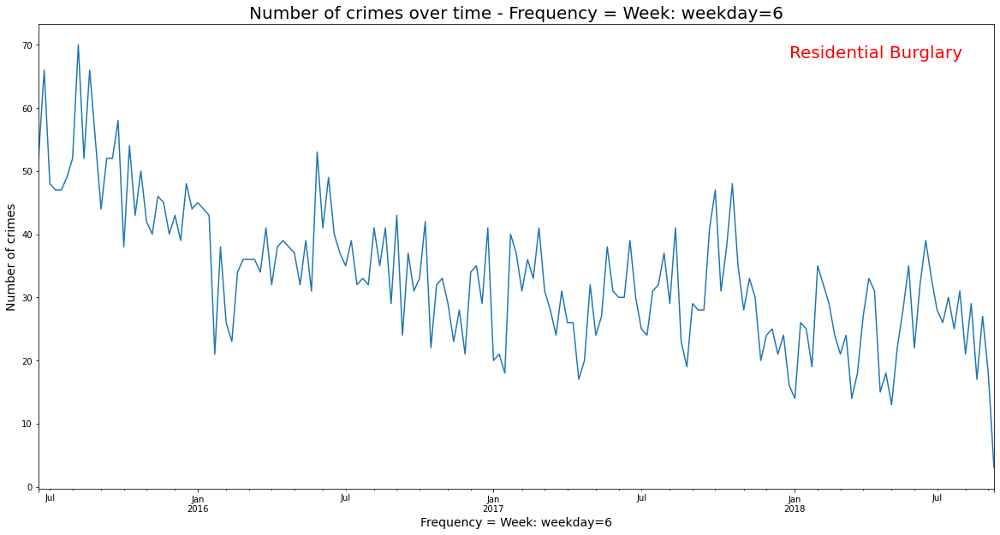

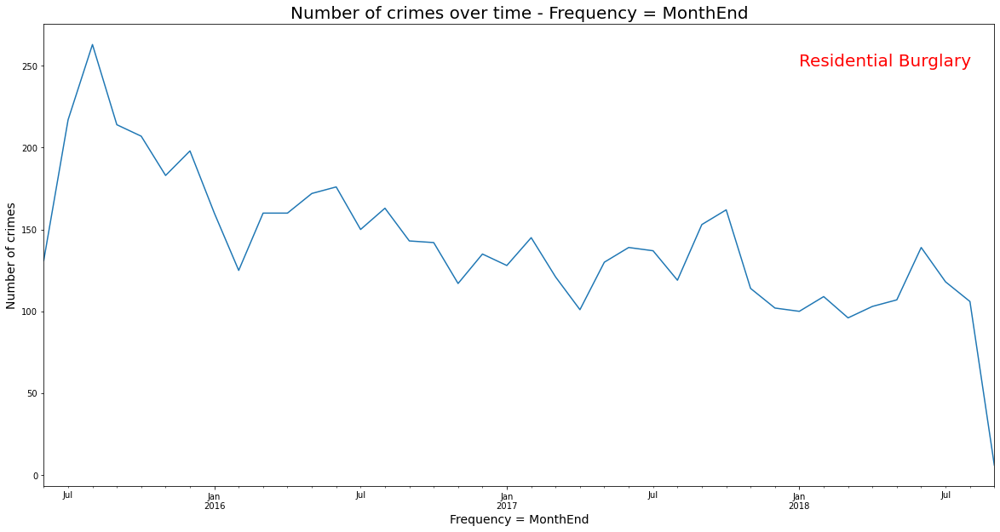

In [73]:
df_moment = df['occurred_on_date'][df.offense_code_group == 'Residential Burglary'].value_counts()
df_day = df_moment.resample('D')
df_week = df_moment.resample('W')
df_month = df_moment.resample('M')
plot_over_time(df_day)
plt.text(17530,17.5,s = 'Residential Burglary', fontsize = 20, color = 'red');
plot_over_time(df_week)
plt.text(2505,68,s = 'Residential Burglary', fontsize = 20, color = 'red');
plot_over_time(df_month)
plt.text(576,250,s = 'Residential Burglary', fontsize = 20, color = 'red');

It shows a clear decline of Residential Burglary over time

- Drug Violation

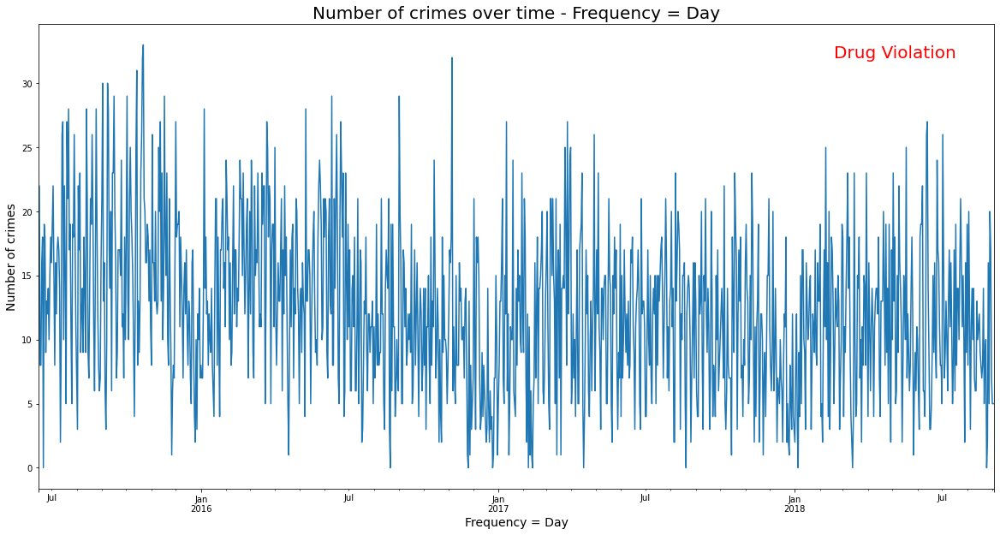

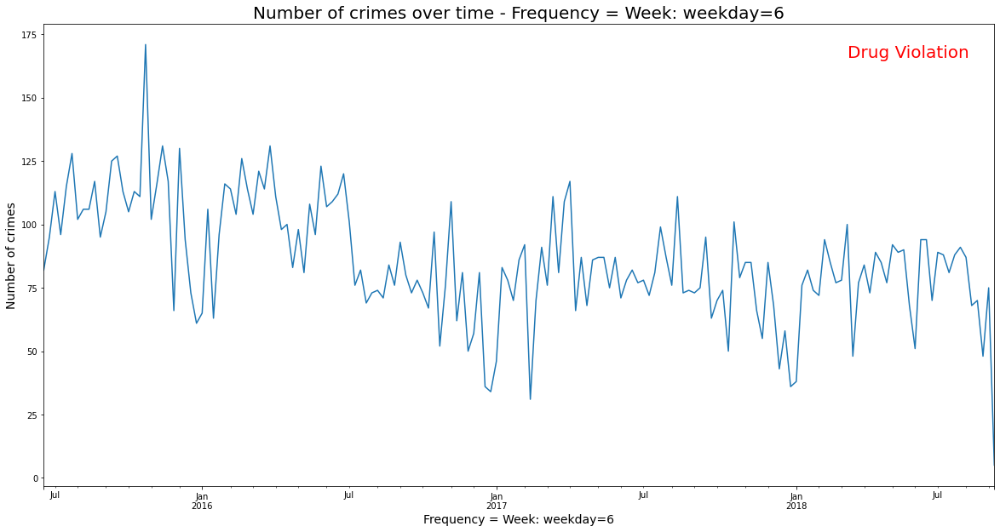

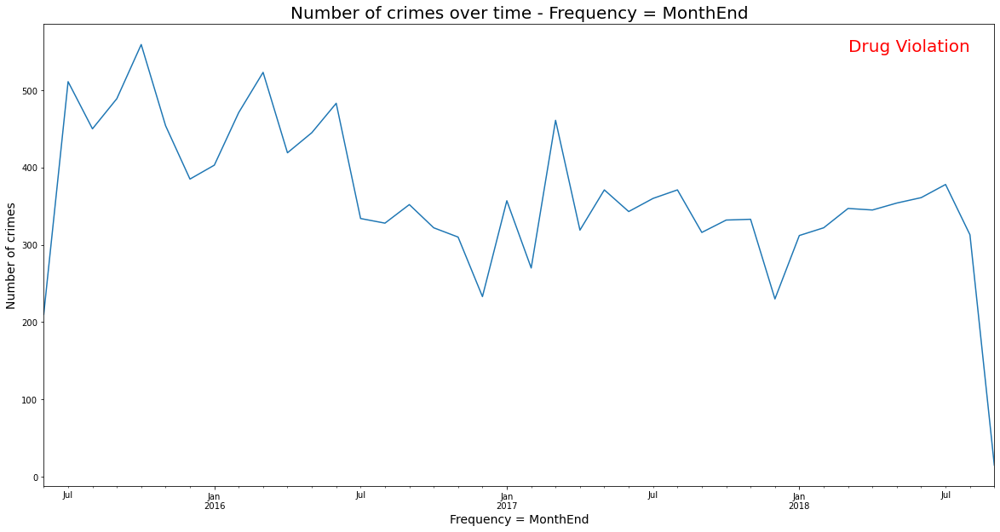

In [74]:
df_moment = df['occurred_on_date'][df.offense_code_group == 'Drug Violation'].value_counts()
df_day = df_moment.resample('D')
df_week = df_moment.resample('W')
df_month = df_moment.resample('M')
plot_over_time(df_day)
plt.text(17580,32,s = 'Drug Violation', fontsize = 20, color = 'red');
plot_over_time(df_week)
plt.text(2515,166,s = 'Drug Violation', fontsize = 20, color = 'red');
plot_over_time(df_month)
plt.text(578,550,s = 'Drug Violation', fontsize = 20, color = 'red');

It shows a slight decline in Drug Violation over time

In [75]:
# 9) year

In [76]:
print_summary('year')

Number of unique values:  4
int64
2017    93498
2016    91825
2018    60939
2015    51135
Name: year, dtype: int64
Null values 0


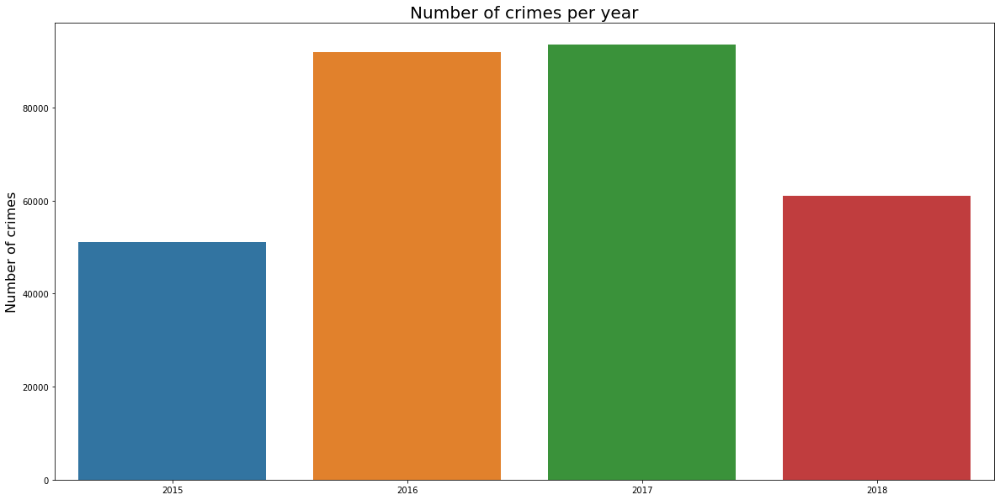

In [77]:
ax = plot_cat_var(df,'year', order = False)


In [78]:
df.occurred_on_date.describe()

C:\Users\glomio\AppData\Local\Temp/ipykernel_91344/727934431.py:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df.occurred_on_date.describe()


count                  297397
unique                 219041
top       2017-06-01 00:00:00
freq                       28
first     2015-06-15 00:00:00
last      2018-09-03 21:25:00
Name: occurred_on_date, dtype: object

The rate of crimes since ot be increasing over the years, the fact that 2018 is not increasing could be due to the fact that the data ends before the end of 2018: lat reported crime on the 2018-09-03

In [79]:
# 10) month

In [80]:
print_summary('month') 

Number of unique values:  12
int64
8     32285
7     32137
6     28580
9     24716
5     24320
10    23930
4     22493
3     22350
1     22225
11    22150
12    22079
2     20132
Name: month, dtype: int64
Null values 0


In [81]:
print_summary('month')

Number of unique values:  12
int64
8     32285
7     32137
6     28580
9     24716
5     24320
10    23930
4     22493
3     22350
1     22225
11    22150
12    22079
2     20132
Name: month, dtype: int64
Null values 0


In [82]:
norm_list_values('month')

8    10.85586
7    10.80609
6     9.61005
9     8.31078
5     8.17762
10    8.04648
4     7.56329
3     7.51521
1     7.47318
11    7.44796
12    7.42408
2     6.76940
Name: month, dtype: float64

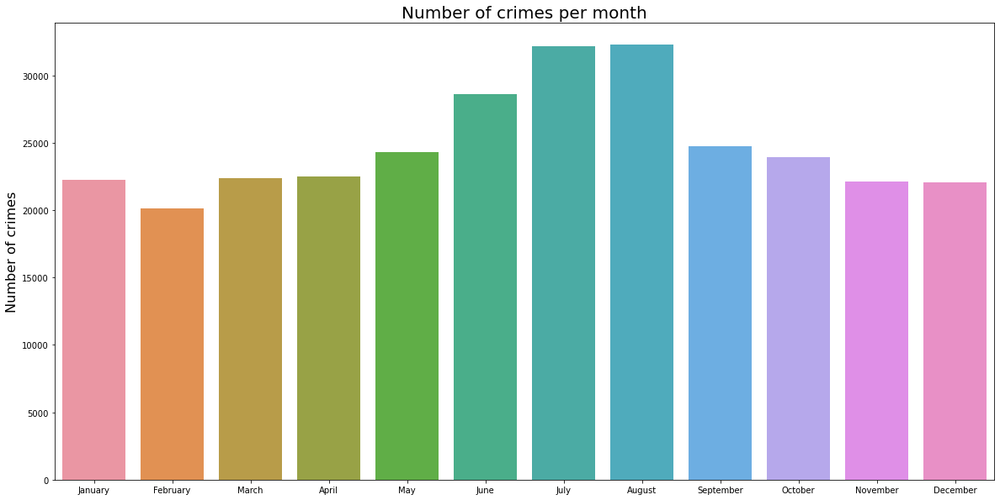

In [83]:
ax = plot_cat_var(df,'month',order = False)
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
                                        # risky code, it works because the months are in number
                                        # if you convert the numbers to months name (as below) and re-run the code, the labelling would be wrong!
                                        # Pay attention!
default_x_ticks = range(len(months))
plt.xticks(default_x_ticks, months)
plt.show()


During the summer the crime rates increases.<br>
It´s true as well that the dataset for the last year (2018) ends in September, so these values could be biased by that

In [84]:
# 11) day_of_week

In [85]:
print_summary('day_of_week')

Number of unique values:  7
object
Friday       45224
Wednesday    43583
Thursday     43409
Tuesday      43118
Monday       42594
Saturday     41677
Sunday       37792
Name: day_of_week, dtype: int64
Null values 0


In [86]:
norm_list_values('day_of_week')

Friday      15.20661
Wednesday   14.65482
Thursday    14.59631
Tuesday     14.49847
Monday      14.32227
Saturday    14.01393
Sunday      12.70759
Name: day_of_week, dtype: float64

Text(0.5, 1.0, 'Number of crimes per day_of_week')

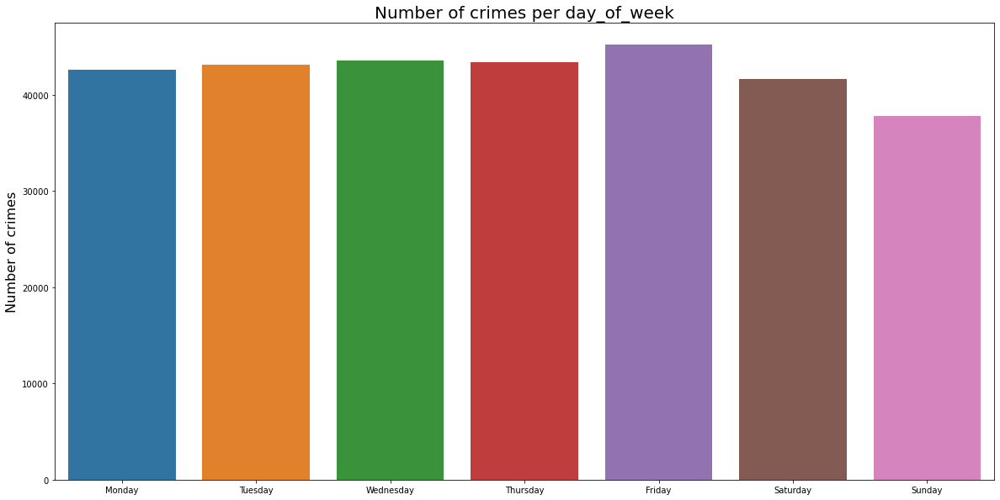

In [87]:
week_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
crimes_per_day = pd.DataFrame({'Count': df['day_of_week'].value_counts().loc[week_days]})
plt.figure(figsize=[20,10])
ax = sns.countplot(data = df, x= 'day_of_week', order = week_days) # need to specify the plot, since in the function I cannot define the correct order. I should modify the fx but for now it´s ok
plt.ylabel('Number of crimes', fontsize=16)
plt.xlabel('')
plt.title('Number of crimes per day_of_week',  fontsize=20)

It seems that there is a pick of crimes on Friday.<br>

In [88]:
# 12) hour
print_summary('hour')

Number of unique values:  24
int64
17    19054
18    18671
16    18476
12    17605
19    16363
14    16067
13    15805
10    15455
11    15445
15    15443
20    14867
0     14115
9     13920
21    13196
8     12222
22    12043
23     9908
1      8419
7      8279
2      6940
6      4657
3      4230
4      3151
5      3066
Name: hour, dtype: int64
Null values 0


In [89]:
norm_list_values('hour')

17   6.40692
18   6.27814
16   6.21257
12   5.91970
19   5.50207
14   5.40254
13   5.31445
10   5.19676
11   5.19339
15   5.19272
20   4.99904
0    4.74618
9    4.68061
21   4.43717
8    4.10966
22   4.04947
23   3.33157
1    2.83090
7    2.78382
2    2.33358
6    1.56592
3    1.42234
4    1.05953
5    1.03095
Name: hour, dtype: float64

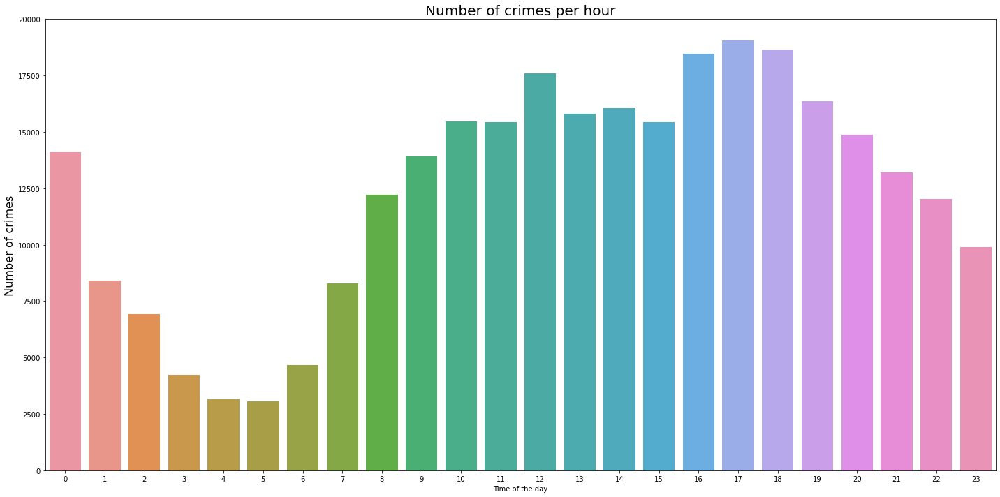

In [90]:
ax = plot_cat_var(df,'hour', order = False)
plt.xlabel('Time of the day')
plt.tight_layout()

It seems there is a peak in crimes in the late afternoon, while the least crime rates it´s around 3-6 in the mornings

In [91]:
# 13) ucr_part: Uniform Crime Reporting Offence types. Part 1 contains the most dangerous and important crimes

In [92]:
print_summary('ucr_part')

Number of unique values:  4
object
Part Three    146534
Part Two       90815
Part One       58812
Other           1147
NaN               89
Name: ucr_part, dtype: int64
Null values 89


UCR has 2 parts, the Part Three is already an "Other" category, so I will assign Other to Part Three

In [93]:
df.ucr_part.loc[df['ucr_part'] == 'Other'] = 'Part Three'

C:\Users\glomio\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


This is an interesting variable, but the NaNs must be imputed.<br>
Let´s dig into it:

In [94]:
df.offense_code_group[df.ucr_part.isnull()].value_counts()

Residential Burglary                        77
Human Traffiking                             7
Investigate Person                           3
Human Traffiking - Involuntary Servitude     2
Name: offense_code_group, dtype: int64

In [95]:
print(df.ucr_part[df.offense_code_group == 'Residential Burglary'].value_counts())
print(df.ucr_part[df.offense_code_group == 'Investigate Person'].value_counts())

Part One    5574
Name: ucr_part, dtype: int64
Part Three    17987
Name: ucr_part, dtype: int64


Residential Burglary type of crime is in ucr_part = Part One.<br>
Investigate Person type of crime, ucr_part = Part Three.<br>
I will assign them accordingly

In [96]:
df.ucr_part.loc[df['offense_code_group'] == 'Residential Burglary'] = 'Part One'
df.ucr_part.loc[df['offense_code_group'] == 'Investigate Person'] = 'Part Three'

In 2013 Human Trafficking and Human Traffiking - Involuntary Servitude have been added to UCR Part One (https://ucr.fbi.gov/human-trafficking)<br>
So I will assign it accordingly

In [97]:
df.ucr_part.loc[df['offense_code_group'] == 'Human Traffiking'] = 'Part One'
df.ucr_part.loc[df['offense_code_group'] == 'Human Traffiking - Involuntary Servitude'] = 'Part One'

Let´s analyse the variable now

In [98]:
print_summary('ucr_part')

Number of unique values:  3
object
Part Three    147684
Part Two       90815
Part One       58898
Name: ucr_part, dtype: int64
Null values 0


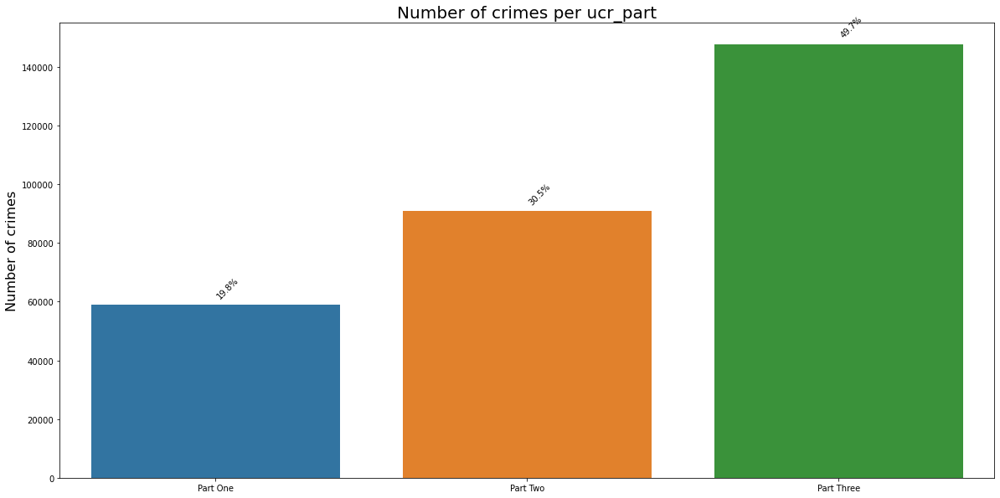

In [99]:
plot_cat_var(df,'ucr_part',plot_perc=True, order = False);

Most crimes are not severe, but a good 20% of crimes is in Part I

In [100]:
count_ucr_dist_norm = df['ucr_part']/df.district.value_counts()

In [101]:
df_distr = pd.DataFrame(df.groupby('ucr_part').district.value_counts(), columns=['district','count'])

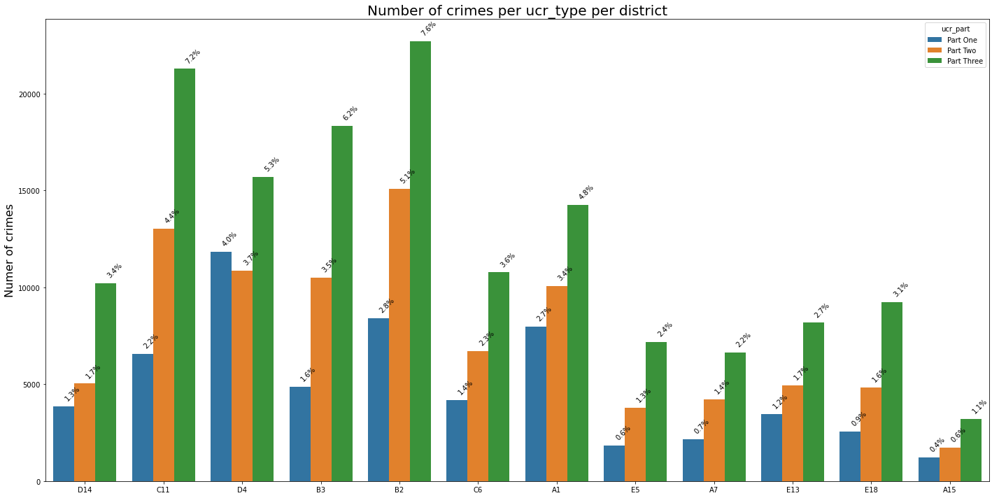

In [102]:
plt.figure(figsize=[20,10])
ax = sns.countplot(data=df,x='district', hue=df['ucr_part'])
total = len(df)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%\n'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), rotation=45, annotation_clip=False)
plt.xlabel('')
plt.ylabel('Numer of crimes', fontsize=16)
plt.xlabel('')
plt.title('Number of crimes per ucr_type per district',  fontsize=20)
plt.tight_layout();

The percentage refers to the total amount of crimes in Boston.<br>
District D4 is the district with the biggest percentage of most dangerous crimes

Let´s have a look on how Part I crimes (most dangerous crimes) are distributed within districts

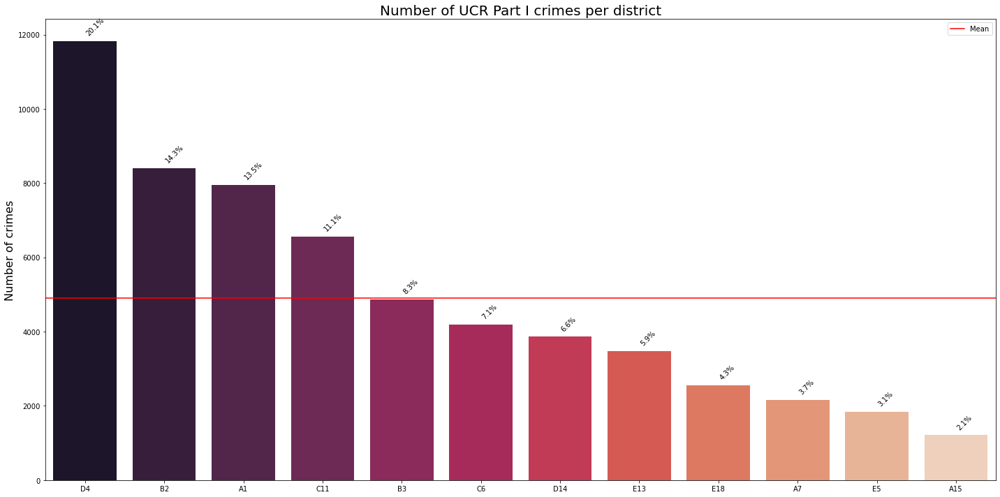

In [103]:
df_ucr_1 = df[df.ucr_part == 'Part One'];
ax = plot_cat_var(df_ucr_1,'district', plot_perc=True,order= True, palette = 'rocket', add_mean = True);
plt.title('Number of UCR Part I crimes per district',  fontsize=20);
plt.tight_layout()

We can have a look at this distrution on the map

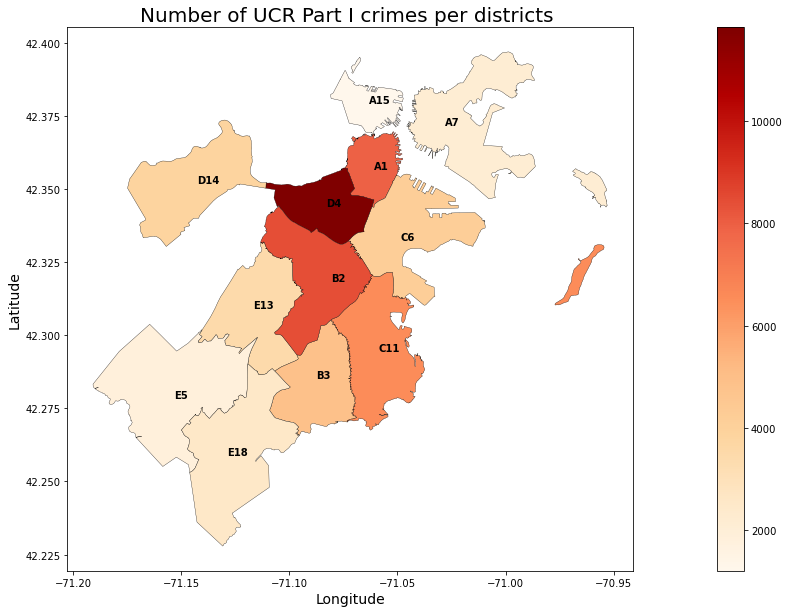

In [104]:
g_dis['point'] = g_dis.representative_point() #Returns a GeoSeries of points that are guaranteed to be within each geometry
label_points = g_dis.copy() # create a copy of geo_info
label_points.set_geometry('point', inplace = True) # set the district geometry to be the representative point
g_dis['part_one'] = g_dis.DISTRICT.map(df['district'][df.ucr_part == 'Part One'].value_counts()) # use map function to match each district with its corresponding value
ax = g_dis.plot(column = g_dis.part_one, cmap = 'OrRd', legend = True, figsize = (30,10), edgecolor = 'black', linewidth = 0.3)
plt.title('Number of UCR Part I crimes per districts ',  fontsize=20)
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)
for x, y, label in zip(label_points.geometry.x, label_points.geometry.y, label_points['DISTRICT']): # add the corresponding label DISTRICT that is is inside g_dis 
    plt.text(x, y, label, fontsize = 10, fontweight = 'bold')

D4 is the district with the highest rate of UCR Part One (more serious) crimes

In [105]:
# 14) street
print_summary('street')

Number of unique values:  3833
object
WASHINGTON ST                14109
BLUE HILL AVE                 6989
BOYLSTON ST                   6937
DORCHESTER AVE                5006
TREMONT ST                    4664
MASSACHUSETTS AVE             4389
CENTRE ST                     4286
HARRISON AVE                  4273
COMMONWEALTH AVE              3865
HYDE PARK AVE                 3403
COLUMBIA RD                   3050
HUNTINGTON AVE                2910
RIVER ST                      2810
WARREN ST                     2294
DUDLEY ST                     2199
COLUMBUS AVE                  2063
ADAMS ST                      1966
NEWBURY ST                    1887
BEACON ST                     1779
W BROADWAY                    1608
BOWDOIN ST                    1582
GENEVA AVE                    1582
CAMBRIDGE ST                  1512
AMERICAN LEGION HWY           1509
ALBANY ST                     1256
HANCOCK ST                    1233
NEW SUDBURY ST                1213
BORDER ST        

In [106]:
norm_list_values('street')

WASHINGTON ST               4.74416
BLUE HILL AVE               2.35006
BOYLSTON ST                 2.33257
DORCHESTER AVE              1.68327
TREMONT ST                  1.56827
MASSACHUSETTS AVE           1.47581
CENTRE ST                   1.44117
HARRISON AVE                1.43680
COMMONWEALTH AVE            1.29961
HYDE PARK AVE               1.14426
COLUMBIA RD                 1.02557
HUNTINGTON AVE              0.97849
RIVER ST                    0.94486
WARREN ST                   0.77136
DUDLEY ST                   0.73942
COLUMBUS AVE                0.69369
ADAMS ST                    0.66107
NEWBURY ST                  0.63451
BEACON ST                   0.59819
W BROADWAY                  0.54069
BOWDOIN ST                  0.53195
GENEVA AVE                  0.53195
CAMBRIDGE ST                0.50841
AMERICAN LEGION HWY         0.50740
ALBANY ST                   0.42233
HANCOCK ST                  0.41460
NEW SUDBURY ST              0.40787
BORDER ST                   

It is a very high cardinality feature.<br>
I won´t consider this for the model because of the cardinality and because I already have some geospatial information features (districts, lat, long).<br>
Then, I won´t take care of NaNs either.<br>
<br>
I will only use this variable to plot the distribution of crimes that happened on the 10 more common roads

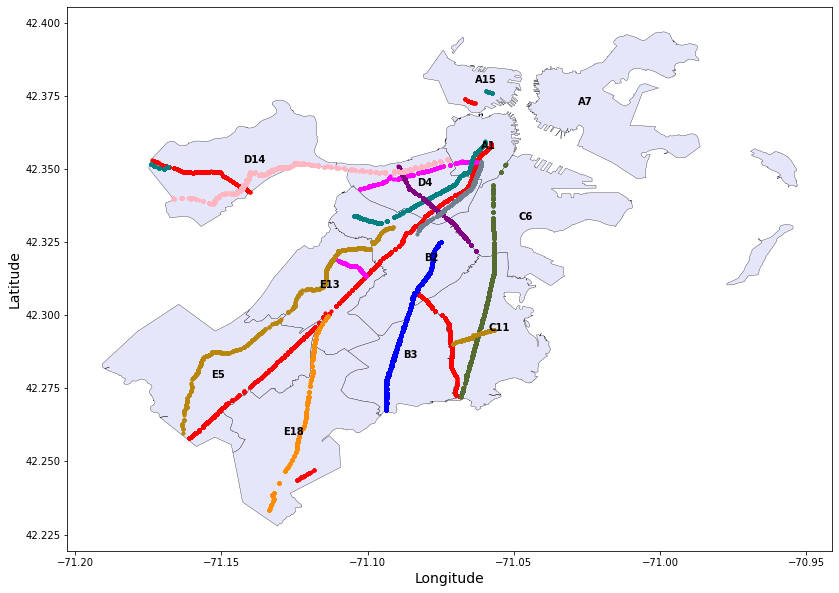

In [107]:
ax = plot_distr_map(df,g_dis) # the code is not very elegant, but it works
points3 = gpd.GeoDataFrame(df[df.street == 'WASHINGTON ST'], geometry=gpd.points_from_xy(df[df.street == 'WASHINGTON ST'].long, df[df.street == 'WASHINGTON ST'].lat))
points3.plot(ax=ax,markersize = 10, color = 'red')
points3 = gpd.GeoDataFrame(df[df.street == 'BLUE HILL AVE'], geometry=gpd.points_from_xy(df[df.street == 'BLUE HILL AVE'].long, df[df.street == 'BLUE HILL AVE'].lat))
points3.plot(ax=ax,markersize = 10, color = 'blue')
points3 = gpd.GeoDataFrame(df[df.street == 'BOYLSTON ST'], geometry=gpd.points_from_xy(df[df.street == 'BOYLSTON ST'].long, df[df.street == 'BOYLSTON ST'].lat))
points3.plot(ax=ax,markersize = 10, color = 'magenta')
points3 = gpd.GeoDataFrame(df[df.street == 'DORCHESTER AVE'], geometry=gpd.points_from_xy(df[df.street == 'DORCHESTER AVE'].long, df[df.street == 'DORCHESTER AVE'].lat))
points3.plot(ax=ax,markersize = 10, color = 'darkolivegreen')
points3 = gpd.GeoDataFrame(df[df.street == 'TREMONT ST'], geometry=gpd.points_from_xy(df[df.street == 'TREMONT ST'].long, df[df.street == 'TREMONT ST'].lat))
points3.plot(ax=ax,markersize = 10, color = 'teal')
points3 = gpd.GeoDataFrame(df[df.street == 'MASSACHUSETTS AVE'], geometry=gpd.points_from_xy(df[df.street == 'MASSACHUSETTS AVE'].long, df[df.street == 'MASSACHUSETTS AVE'].lat))
points3.plot(ax=ax,markersize = 10, color = 'purple')
points3 = gpd.GeoDataFrame(df[df.street == 'CENTRE ST'], geometry=gpd.points_from_xy(df[df.street == 'CENTRE ST'].long, df[df.street == 'CENTRE ST'].lat))
points3.plot(ax=ax,markersize = 10, color = 'darkgoldenrod')
points3 = gpd.GeoDataFrame(df[df.street == 'HARRISON AVE'], geometry=gpd.points_from_xy(df[df.street == 'HARRISON AVE'].long, df[df.street == 'HARRISON AVE'].lat))
points3.plot(ax=ax,markersize = 10, color = 'slategrey')
points3 = gpd.GeoDataFrame(df[df.street == 'COMMONWEALTH AVE'], geometry=gpd.points_from_xy(df[df.street == 'COMMONWEALTH AVE'].long, df[df.street == 'COMMONWEALTH AVE'].lat))
points3.plot(ax=ax,markersize = 10, color = 'lightpink')
points3 = gpd.GeoDataFrame(df[df.street == 'HYDE PARK AVE'], geometry=gpd.points_from_xy(df[df.street == 'HYDE PARK AVE'].long, df[df.street == 'HYDE PARK AVE'].lat))
points3.plot(ax=ax,markersize = 10, color = 'darkorange')
plt.show()

We can see the most common streets for crimes.<br>
This variable it is not really "clean",as we can see on the map, for some crimes the location (lat,long) is not really matching the street name assigned to the crime.<br>
Since it is not a "clean" variable, it makes even more sense to disregard this feature.<br>

In [108]:
# 15) location: not considered as said before, it is a combination of lat and long

### Elimination of redundant features or features I disregarded for now <a class="anchor" id="feature_elim"></a>

I create a copy of the DF before deleting the variables I won´t use

In [109]:
# If you need to restore the DF, uncomment this:
#df = df_before_del_col

In [110]:
df.reset_index(drop=True, inplace = True) # Reset index, in case I forgot to do it before when deleting rows
df_before_del_col = df.copy() # create a copy of the DF before dropping columns

Features disregarded:
- incident_number --> not useful,crime identifier
- offense_code --> for now i will only ocnsider offence_code_group
- offence_description --> for now i will only ocnsider offence_code_group
- reporting_area --> high cardinality, for now I will only consider districts and coordinates as geographical info
- occurred_on_date --> useful in the case of time series analysis
- year -> not useful unless we want to see a trend on crimes over years
- street --> high cardinality, for now I will only consider districts and coordinates as geographical info
- location --> redundant, it consists of lat and long coordinates

In [111]:
df.drop('incident_number', axis = 1, inplace = True)
df.drop('offense_code', axis = 1, inplace = True)
df.drop('offense_description', axis = 1, inplace = True)
df.drop('reporting_area', axis = 1, inplace = True)
df.drop('occurred_on_date', axis = 1, inplace = True)
df.drop('year', axis = 1, inplace = True)
df.drop('street', axis = 1, inplace = True)
df.drop('location', axis = 1, inplace = True)

In [112]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 297397 entries, 0 to 297396
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   offense_code_group  297397 non-null  object 
 1   district            297397 non-null  object 
 2   shooting            297397 non-null  int32  
 3   month               297397 non-null  int64  
 4   day_of_week         297397 non-null  object 
 5   hour                297397 non-null  int64  
 6   ucr_part            297397 non-null  object 
 7   lat                 297397 non-null  float64
 8   long                297397 non-null  float64
dtypes: float64(2), int32(1), int64(2), object(4)
memory usage: 19.3+ MB


All remaining features have no NaNs.<br>

### Feature engineering<a class="anchor" id="feature_eng"></a>
- Convert hours of the day in groups:<br>
Night, Morning, Afternoon, Evening<br>
<br>

In [113]:
lookup = {
    1: 'Night',
    2: 'Night',
    3: 'Night',
    4: 'Night',
    5: 'Night',
    6: 'Night',
    7: 'Morning',
    8: 'Morning',
    9: 'Morning',
    10: 'Morning',
    11: 'Morning',
    12: 'Morning',
    13:'Afternoon',
    14:'Afternoon',
    15:'Afternoon',
    16:'Afternoon',
    17:'Afternoon',
    18:'Afternoon',
    19:'Evening',
    20:'Evening',
    21:'Evening',
    22:'Evening',
    23:'Evening',
    0:'Evening'
}
for fname in os.listdir('.'):
    df['day_period'] = df['hour'].apply(lambda x: lookup[x])

In [114]:
df.head()

,offense_code_group,district,shooting,month,day_of_week,hour,ucr_part,lat,long,day_period
0,Larceny,D14,0,9,Sunday,13,Part One,42.35779,-71.13937,Afternoon
1,Vandalism,C11,0,8,Tuesday,0,Part Two,42.30682,-71.06030,Evening
2,Towed,D4,0,9,Monday,19,Part Three,42.34659,-71.07243,Evening
3,Investigate Property,D4,0,9,Monday,21,Part Three,42.33418,-71.07866,Evening
4,Investigate Property,B3,0,9,Monday,21,Part Three,42.27537,-71.09036,Evening


- Convert months into seasons

In [115]:
lookup = {
    12: 'Winter',
    1: 'Winter',
    2: 'Winter',
    3: 'Spring',
    4: 'Spring',
    5: 'Spring',
    6: 'Summer',
    7: 'Summer',
    8: 'Summer',
    9: 'Autumn',
    10: 'Autumn',
    11: 'Autumn'
}
for fname in os.listdir('.'):
    df['season'] = df['month'].apply(lambda x: lookup[x])

- Convert day_of_week in "is weekday"<br>
<br>

In [116]:
lookup = {
    'Monday': 1,
    'Tuesday': 1,
    'Wednesday': 1,
    'Thursday': 1,
    'Friday': 1,
    'Saturday': 0,
    'Sunday': 0,
}
for fname in os.listdir('.'):
    df['weekday'] = df['day_of_week'].apply(lambda x: lookup[x])

In [117]:
df.sample(10)

,offense_code_group,district,shooting,month,day_of_week,hour,ucr_part,lat,long,day_period,season,weekday
44150,Motor Vehicle Accident Response,D4,0,3,Friday,19,Part Three,42.34147,-71.09083,Evening,Spring,1
188065,Larceny,D4,0,8,Sunday,13,Part One,42.35245,-71.08354,Afternoon,Summer,0
283750,Investigate Property,E5,0,8,Wednesday,11,Part Three,42.27563,-71.13142,Morning,Summer,1
98056,Larceny,E13,0,8,Thursday,12,Part One,42.31772,-71.09823,Morning,Summer,1
55539,Medical Assistance,C11,0,1,Friday,11,Part Three,42.27182,-71.06806,Morning,Winter,1
297282,Other,E13,0,9,Friday,18,Part Two,42.31526,-71.10228,Afternoon,Autumn,1
149509,Evading Fare,B2,0,1,Monday,20,Part Two,42.31195,-71.07872,Evening,Winter,1
105622,Investigate Person,C11,0,7,Thursday,17,Part Three,42.29882,-71.06570,Afternoon,Summer,1
81477,Harassment,C11,0,12,Thursday,9,Part Two,42.30344,-71.06675,Morning,Winter,1
51952,Harassment,B2,0,2,Saturday,15,Part Two,42.33280,-71.10793,Afternoon,Winter,0


Drop months, hours and day_of_week

In [118]:
df.drop('month', axis = 1, inplace = True)
df.drop('hour', axis = 1, inplace = True)
df.drop('day_of_week', axis = 1, inplace = True)

I save cleaned data and new features:

In [119]:
df.to_csv('df_crimes_cleaned.csv')

# MLC3: Data transformation<a class="anchor" id="data_tranf"></a>

If I will want to create a model with the categorical variables, I need to One-Hot-Encode them.

In [120]:
df = pd.read_csv('df_crimes_cleaned.csv', sep=",", index_col=0)
df.head()

,offense_code_group,district,shooting,ucr_part,lat,long,day_period,season,weekday
0,Larceny,D14,0,Part One,42.35779,-71.13937,Afternoon,Autumn,0
1,Vandalism,C11,0,Part Two,42.30682,-71.06030,Evening,Summer,1
2,Towed,D4,0,Part Three,42.34659,-71.07243,Evening,Autumn,1
3,Investigate Property,D4,0,Part Three,42.33418,-71.07866,Evening,Autumn,1
4,Investigate Property,B3,0,Part Three,42.27537,-71.09036,Evening,Autumn,1


In [121]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 297397 entries, 0 to 297396
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   offense_code_group  297397 non-null  object 
 1   district            297397 non-null  object 
 2   shooting            297397 non-null  int64  
 3   ucr_part            297397 non-null  object 
 4   lat                 297397 non-null  float64
 5   long                297397 non-null  float64
 6   day_period          297397 non-null  object 
 7   season              297397 non-null  object 
 8   weekday             297397 non-null  int64  
dtypes: float64(2), int64(2), object(5)
memory usage: 22.7+ MB


### Data transformation of categorical variables<a class="anchor" id="transformation_categorical"></a>

One-Hot Endcoding of categorical variables:

In [122]:
list_obj = list(df.select_dtypes(include=['object']).columns) # list of object columns
# encode all object variables at once
for i in list_obj:
    dummy_var = pd.get_dummies(df[i], sparse = False, prefix = i) # One hot encoding with get_dummies
    df = df.join(dummy_var)
    df = df.drop(i, axis = 1)
    del dummy_var

In [123]:
df.head()

,shooting,lat,long,weekday,offense_code_group_Aggravated Assault,offense_code_group_Aircraft,offense_code_group_Arson,offense_code_group_Assembly or Gathering Violations,offense_code_group_Auto Theft,offense_code_group_Auto Theft Recovery,offense_code_group_Ballistics,offense_code_group_Biological Threat,offense_code_group_Bomb Hoax,offense_code_group_Commercial Burglary,offense_code_group_Confidence Games,offense_code_group_Counterfeiting,offense_code_group_Criminal Harassment,offense_code_group_Disorderly Conduct,offense_code_group_Drug Violation,offense_code_group_Embezzlement,offense_code_group_Evading Fare,offense_code_group_Explosives,offense_code_group_Fire Related Reports,offense_code_group_Firearm Discovery,offense_code_group_Firearm Violations,offense_code_group_Fraud,offense_code_group_Gambling,offense_code_group_Harassment,offense_code_group_Harbor Related Incidents,offense_code_group_Homicide,offense_code_group_Human Traffiking,offense_code_group_Human Traffiking - Involuntary Servitude,offense_code_group_Investigate Person,offense_code_group_Investigate Property,offense_code_group_Landlord/Tenant Disputes,offense_code_group_Larceny,offense_code_group_Larceny From Motor Vehicle,offense_code_group_License Plate Related Incidents,offense_code_group_License Violation,offense_code_group_Liquor Violation,offense_code_group_Manslaughter,offense_code_group_Medical Assistance,offense_code_group_Missing Person Located,offense_code_group_Missing Person Reported,offense_code_group_Motor Vehicle Accident Response,offense_code_group_Offenses Against Child / Family,offense_code_group_Operating Under the Influence,offense_code_group_Other,offense_code_group_Other Burglary,offense_code_group_Phone Call Complaints,offense_code_group_Police Service Incidents,offense_code_group_Prisoner Related Incidents,offense_code_group_Property Found,offense_code_group_Property Lost,offense_code_group_Property Related Damage,offense_code_group_Prostitution,offense_code_group_Recovered Stolen Property,offense_code_group_Residential Burglary,offense_code_group_Restraining Order Violations,offense_code_group_Robbery,offense_code_group_Search Warrants,offense_code_group_Service,offense_code_group_Simple Assault,offense_code_group_Towed,offense_code_group_Vandalism,offense_code_group_Verbal Disputes,offense_code_group_Violations,offense_code_group_Warrant Arrests,district_A1,district_A15,district_A7,district_B2,district_B3,district_C11,district_C6,district_D14,district_D4,district_E13,district_E18,district_E5,ucr_part_Part One,ucr_part_Part Three,ucr_part_Part Two,day_period_Afternoon,day_period_Evening,day_period_Morning,day_period_Night,season_Autumn,season_Spring,season_Summer,season_Winter
0,0,42.35779,-71.13937,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0
1,0,42.30682,-71.06030,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0
2,0,42.34659,-71.07243,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0
3,0,42.33418,-71.07866,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0
4,0,42.27537,-71.09036,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0


I will use this in another notebook for analysis with Pycaret, if I have time to do it.

Save tranformed data to be used for modelling considering all the variable:

In [124]:
df.to_csv('df_crimes_tranformed.csv')

# Clustering Analysis of Larceny<a class="anchor" id="cluster_larceny"></a>

I want to evaluate if I can get some insights of one of the most diffused crime: Larceny.<br>
I want to see if I can identify some specific locations where the rate of larceny is high.<br>
This could help the Police increasing the patrol in those locations and as well make people aware to be particularly careful on their handbags/wallets in those locations.

Selecting only larceny crimes and removing columns I won´t use in this type of analysis:<br>
All columns but latitude and longitude:

In [125]:
df = pd.read_csv('df_crimes_cleaned.csv', sep=",", index_col=0)
df.head()

,offense_code_group,district,shooting,ucr_part,lat,long,day_period,season,weekday
0,Larceny,D14,0,Part One,42.35779,-71.13937,Afternoon,Autumn,0
1,Vandalism,C11,0,Part Two,42.30682,-71.06030,Evening,Summer,1
2,Towed,D4,0,Part Three,42.34659,-71.07243,Evening,Autumn,1
3,Investigate Property,D4,0,Part Three,42.33418,-71.07866,Evening,Autumn,1
4,Investigate Property,B3,0,Part Three,42.27537,-71.09036,Evening,Autumn,1


In [126]:
print('Subset of the total data', str(df.offense_code_group[df.offense_code_group =='Larceny'].value_counts()))
df_L=df[df.offense_code_group =='Larceny']

Subset of the total data Larceny    25078
Name: offense_code_group, dtype: int64


Having a general look at the distribution of Larceny in the different Districts:

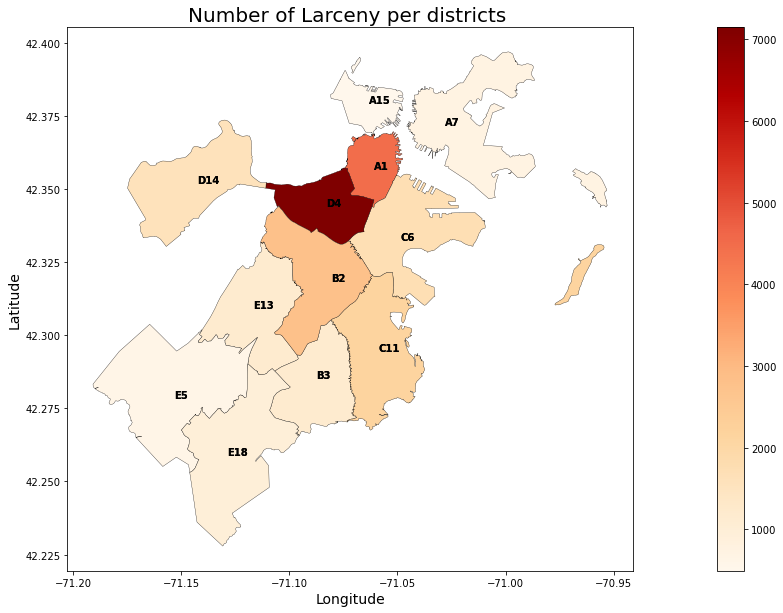

In [127]:
plot_distr_map(df_L,g_dis, True);
plt.title('Number of Larceny per districts ',  fontsize=20)
plt.ylabel("Latitude", fontsize=14)
plt.xlabel("Longitude", fontsize=14)
for x, y, label in zip(label_points.geometry.x, label_points.geometry.y, label_points['DISTRICT']): # add the corresponding label DISTRICT that is is inside g_dis 
    plt.text(x, y, label, fontsize = 10, fontweight = 'bold')


D4, followed by A1 are the areas with highest larceny rate.<br>
Anyway this gives only a general information, considering the districts have a big area.<br>
<br>
Other discricts seems to have a low rate of larceny, but I want to see if even in those districts there are areas where you should be careful with your bags.<br>
I want now see if I can identify specific clusters (areas) within the Boston map, where there is a high rate of larceny, even in districts with low average Larcery rate.

In [128]:
df_L.head()

,offense_code_group,district,shooting,ucr_part,lat,long,day_period,season,weekday
0,Larceny,D14,0,Part One,42.35779,-71.13937,Afternoon,Autumn,0
33,Larceny,B2,0,Part One,42.33318,-71.08308,Afternoon,Autumn,1
38,Larceny,B3,0,Part One,42.30155,-71.08118,Afternoon,Autumn,1
47,Larceny,A1,0,Part One,42.35602,-71.06178,Afternoon,Autumn,1
53,Larceny,D14,0,Part One,42.33540,-71.15026,Night,Autumn,1


In [129]:
districts = df_L.district

### Removing all columns but lat and long

In [130]:
df_L.drop('offense_code_group', axis = 1, inplace = True)
df_L.drop('district', axis = 1, inplace = True)
df_L.drop('shooting', axis = 1, inplace = True)
df_L.drop('ucr_part', axis = 1, inplace = True)
df_L.drop('day_period', axis = 1, inplace = True)
df_L.drop('season', axis = 1, inplace = True)
df_L.drop('weekday', axis = 1, inplace = True)

C:\Users\glomio\Anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


### Prepare the data for the clustering analysis

For the scope of what I want to find, I don´t really need a testing dataset, since what I want from the clustering is an insight on the data, not a prediction<br>
I will keep keep anyway a 5% for it

In [131]:
data = df_L.sample(frac=0.95, random_state=17)
data_unseen = df_L.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (23824, 2)
Unseen Data For Predictions: (1254, 2)


In [132]:
data.head()

,lat,long
0,42.27531,-71.11588
1,42.35103,-71.06373
2,42.31929,-71.05027
3,42.33311,-71.07276
4,42.32849,-71.08121


### Data Normalization<a class="anchor" id="data_scal"></a>

In [133]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data.to_numpy())
scaled_data[0]

array([-2.03179585, -1.27455509])

# K-means algorithm<a class="anchor" id="kmeans"></a>

I will apply K-means just for trying, but I know this is not the type of algorithm needed to identify the type of clusters that I´m looking for

Evaluating the best number of clusters:
- elbow curve
- silhouette curve

In [134]:
distortions = []
K = range(1,15)

for cluster_size in K:
    kmeans = cluster.KMeans(n_clusters=cluster_size, init='k-means++')
    kmeans = kmeans.fit(scaled_data)
    distortions.append(kmeans.inertia_)
df_c = pd.DataFrame({'Clusters': K, 'Distortions': distortions})

In [135]:
#from plotly.offline import iplot
#from plotly.subplots import make_subplots
#import plotly.graph_objs as go

In [136]:
diff_distortions = [0]
for i in range(1,len(distortions)-1):
        diff = distortions[i]-distortions[i+1]
        diff_distortions.append(diff)
diff_distortions.append(0)
diff_distortions = pd.Series(diff_distortions)

fig = make_subplots(specs=[[{'secondary_y': True}]])    
fig.add_trace(go.Scatter(x=df_c.Clusters, y=distortions, mode = 'lines+markers', name='Distortions'),secondary_y=False)
fig.add_trace(go.Scatter(x = df_c.Clusters, y = diff_distortions, mode = 'lines',line=go.scatter.Line(color="gray"), name='Distortions differences'),secondary_y=True) # *5 for visualization purposes, not really elegant...
fig.update_xaxes(title_text="Number of clusters")
fig.update_yaxes(title_text="<b>Distortions</b> Y - axis ", secondary_y=False)
fig.update_yaxes(title_text="<b>Distortions differences</b> Y - axis ", secondary_y=True)
fig.update_layout(font_size=14,title_text="Distortion Score - Elbow curve", title_font_size=20, font_color='black',title_x=0.5)
fig.show()

In [137]:
silhouette_scores = []
K = range(2,16)

for cluster_size in K:
    kmeans = cluster.KMeans(n_clusters=cluster_size, init='k-means++', random_state=200)
    labels = kmeans.fit(scaled_data).labels_
    silhouette_score = metrics.silhouette_score(scaled_data, 
                                                labels, 
                                                metric='euclidean', 
                                                random_state=17)
    
    silhouette_scores.append(silhouette_score)

df_s = pd.DataFrame({'Clusters': K, 'Silhouette Score': silhouette_scores})

fig = (px.line(df_s, x='Clusters', y='Silhouette Score', template='seaborn')).update_traces(mode='lines+markers')
fig.update_yaxes(title_text='Silhouette Score')
fig.update_xaxes(title_text='Number of Clusters')
fig.update_layout(font_size=14,title_text="Silhouette score curve", title_font_size=20, font_color='black',title_x=0.5)
fig.show()


The silhouette is max on 14 clusters.<br>
I´m trying with it, even if I know this is not the correct clustering algorithm neither the correct matric for the type of cluster I´m looking at.<br>

In [138]:
kmeans = cluster.KMeans(n_clusters=14, init='k-means++')
kmeans = kmeans.fit(scaled_data)
data['cluster_group_KMEANS'] = kmeans.labels_

In [139]:
plot_clusters('cluster_group_KMEANS')
plot_cluster_info('cluster_group_KMEANS')

count   23824.00000
mean        5.71650
std         4.25766
min         0.00000
25%         1.00000
50%         5.00000
75%         9.00000
max        13.00000
Name: cluster_group_KMEANS, dtype: float64
Number of clusters=  14


K-means, as per the algorithm implementation itself, is able to only identify clusters which seems to represent larceny crimes grouped by areas of the city.<br>
This is not exaclty what I´m looking for.<br>
I won´t analyse this algorithm any further, since for what I want to find I need a density based algorithm.<br>

# DBSCAN algorithm<a class="anchor" id="dbscan"></a>

As per DBSCAN algorithm description in scikit learn documentation:<br>
<br>
The DBSCAN algorithm views clusters as areas of high density separated by areas of low density. Due to this rather generic view, clusters found by DBSCAN can be any shape, as opposed to k-means which assumes that clusters are convex shaped. The central component to the DBSCAN is the concept of core samples, which are samples that are in areas of high density. A cluster is therefore a set of core samples, each close to each other (measured by some distance measure) and a set of non-core samples that are close to a core sample (but are not themselves core samples).<br>
There are two parameters to the algorithm, min_samples and eps, which define formally what we mean when we say dense. Higher min_samples or lower eps indicate higher density necessary to form a cluster.<br>
More formally, we define a core sample as being a sample in the dataset such that there exist min_samples other samples within a distance of eps, which are defined as neighbors of the core sample.<br>
A cluster also has a set of non-samples, which are samples that are neighbors of a core sample in the cluster but are not themselves core samples. Intuitively, these samples are on the fringes of a cluster.<br>
<br>
This is exactly what I need in my case.

In [140]:
dbscan = DBSCAN(eps=0.09, min_samples=185)
dbscan = dbscan.fit(scaled_data)
data['cluster_group_DBSCAN'] = dbscan.labels_

DBSCAN is applied across various applications. The input parameters 'eps' and 'minPts' should be chosen guided by the problem domain. For example, clustering points spread across some geography( e.g. GPS coordinates points). The eps parameter is associated with the geographic scale of the study area. A larger value for eps results in broader clusters, while a smaller value establishes narrower clusters. The minPts parameter specifies the minimum number of points (i.e., cluster members) required to produce a new cluster. A larger value of minPts assures a more robust cluster but may exclude some potentially smaller areas as it attempts to merge them in a larger one. On the other hand, a smaller value extracts many clusters, but the resultant clusters may include noise as well.

In [141]:
plot_cluster_info('cluster_group_DBSCAN')
plot_clusters('cluster_group_DBSCAN')

count   23824.00000
mean        0.53450
std         2.46622
min        -1.00000
25%        -1.00000
50%         0.00000
75%         1.00000
max        11.00000
Name: cluster_group_DBSCAN, dtype: float64
Number of clusters=  12  + the "noise" cluster


I found 12 clusters and the "in no cluster" group, which is considered noice.<br>
The algorithm seems to identify some specific locations of high larceny rate.<br>
It fails to identify specific areas within the bigger cluster (cluster_group_DBSCAN = 0), but it identify it in general as an area of high larceny rate.<br>
As a matter of facts, it is because of the difference in larceny rate in district D4 and A1 compared to the other districs: the eps and min_samples values should be changed to identify specific high larceny areas within those districts only (which would put all the other clusters into noise instead).


I will evaluate further on their meaning and how I found the optimized values for eps and min_samples

Tthe silhouette score is not giving meaninful results for non-convex clustering algorithm (from documentation):<br>
"2.3.10.5.2. Drawbacks<br>
The Silhouette Coefficient is generally higher for convex clusters than other concepts of clusters, such as density based clusters like those obtained through DBSCAN."<br>
<br>
I have to find some other way to evaluate the clusters.

More on how to evaluate DBSCAN performances:
- “DBSCAN revisited, revisited: why and how you should (still) use DBSCAN. Schubert, E., Sander, J., Ester, M., Kriegel, H. P., & Xu, X. (2017). In ACM Transactions on Database Systems (TODS), 42(3), 19.
- OPTICS: ordering points to identify the clustering structure: https://doi.org/10.1145/304181.304187

The desirable amount of noise will usually be between 1% and 30%<br>
In my case, it is 44%.<br>
Anyway, this is a bit what I requested from the algorithm.<br>
I want to esclude sparse points (many) and only focus on the small areas with high density so that I can locate high larceny risk locations. In other words, I´m asking for increasing the noise and reducing the size of each cluster<br>

# OPTICS used with DBSCAN cluster method<a class="anchor" id="optics_dbscan"></a>

The OPTICS algorithm shares many similarities with the DBSCAN algorithm, and can be considered a generalization of DBSCAN that relaxes the eps requirement from a single value to a value range.<br>
<br>
Setting max_eps to a lower value will result in shorter run times, and can be thought of as the maximum neighborhood radius from each point to find other potential reachable points.

In this case I´m using the OPTICS model but with the DBSCAN algorithm: I will get the same results as above with the same parameters, but I will be able to compute the reachability plot to establish the best eps value for a specific min_samples size.

In [142]:
scaled_data[0]

array([-2.03179585, -1.27455509])

In [143]:
optics = OPTICS(eps = 0.09, min_samples=185, cluster_method = 'dbscan')
optics = optics.fit(scaled_data)
data['cluster_group_OPTICS_DBSCAN'] = optics.labels_
nb_clusters = data['cluster_group_OPTICS_DBSCAN'].max()

count   23824.00000
mean        1.48993
std         2.85692
min        -1.00000
25%        -1.00000
50%         0.00000
75%         4.00000
max        11.00000
Name: cluster_group_OPTICS_DBSCAN, dtype: float64
Number of clusters=  12  + the "noise" cluster


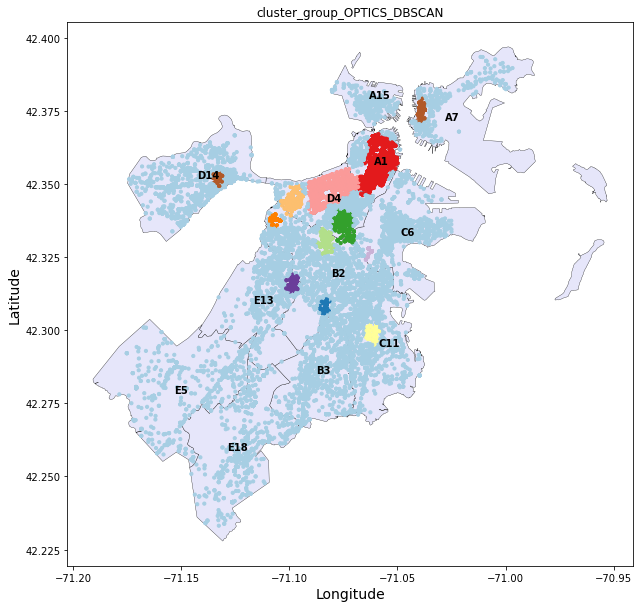

In [144]:
plot_cluster_info('cluster_group_OPTICS_DBSCAN')
plot_clusters('cluster_group_OPTICS_DBSCAN')
fig = plot_distr_map(df_L,g_dis)
plot_cluster_on_map('cluster_group_OPTICS_DBSCAN')

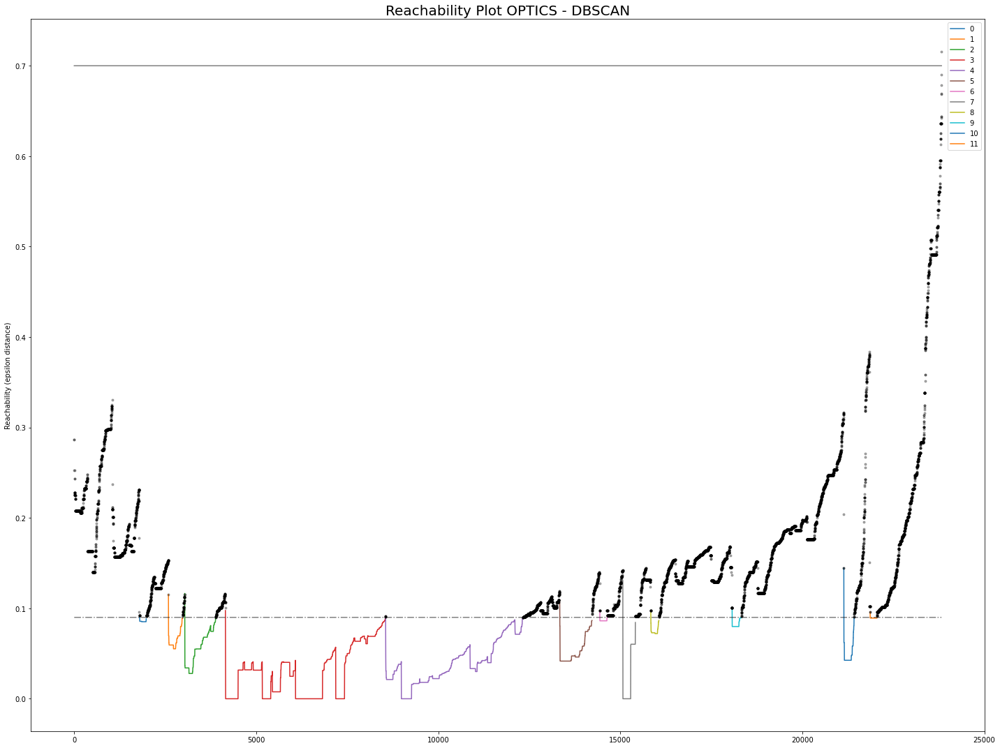

In [145]:
space = np.arange(len(scaled_data))
reachability = optics.reachability_[optics.ordering_]
labels = optics.labels_[optics.ordering_]

plt.figure(figsize=(20, 15)) # very bad plot coding, I did not adapt from subplot, but I have no time to fix it
G = gridspec.GridSpec(1, 1)
ax1 = plt.subplot(G[0, :])

# Reachability plot
klass_list = []
for klass in zip(range(0, nb_clusters+1)):
    Xk = space[labels == klass]
    Rk = reachability[labels == klass]
    ax1.plot(Xk, Rk)
    klass_list.append(klass[0])
ax1.legend(klass_list,loc="upper right")
ax1.plot(space[labels == -1], reachability[labels == -1], "k.", alpha=0.3)
ax1.plot(space, np.full_like(space, 0.7, dtype=float), "k-", alpha=0.5)
ax1.plot(space, np.full_like(space, 0.09, dtype=float), "k-.", alpha=0.5)
ax1.set_ylabel("Reachability (epsilon distance)")
ax1.set_title('Reachability Plot OPTICS - DBSCAN', fontsize=20)
plt.tight_layout()

In the reachability plot, I can see that to find specific areas within the bigger clusters (red and purple), I would need to further decrease eps (different segmentation on the above reachability plot); They could be as well simply big areas with high larceny rate<br>
On the other hand to extract other clusters within the "noise", I would need instead to increase the eps (leading to all the middle clusters extracted to be merged into the bigger cluster 0);<br>
The eps value I found seems to be the one who extract most clusters<br>
<br>
Of course changing the values of min_sample influence the results too. I´ve tried various values for min_sample

I can evaluate OPTICS algorithm since, as stated in the documentation and before: can be considered a generalization of DBSCAN that relaxes the eps requirement from a single value to a value range

# OPTICS<a class="anchor" id="optics"></a>

I´ll try OPTICS with the xi algorithm (default) instead of DBSCAN

In [146]:
optics = OPTICS(max_eps = 0.1, min_samples=185, xi=0.01)
optics = optics.fit(scaled_data)
data['cluster_group_OPTICS'] = optics.labels_
nb_clusters = data['cluster_group_OPTICS'].max()

C:\Users\glomio\Anaconda3\lib\site-packages\sklearn\cluster\_optics.py:903: RuntimeWarning:

divide by zero encountered in true_divide



count   23824.00000
mean        3.63843
std         7.40437
min        -1.00000
25%        -1.00000
50%        -1.00000
75%         8.00000
max        24.00000
Name: cluster_group_OPTICS, dtype: float64
Number of clusters=  25  + the "noise" cluster


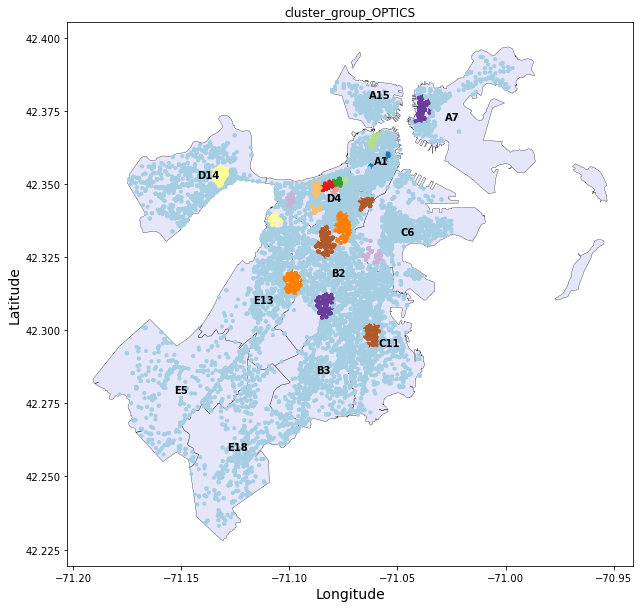

In [147]:
plot_cluster_info('cluster_group_OPTICS')
plot_clusters('cluster_group_OPTICS')
fig = plot_distr_map(df_L,g_dis)
plot_cluster_on_map('cluster_group_OPTICS')

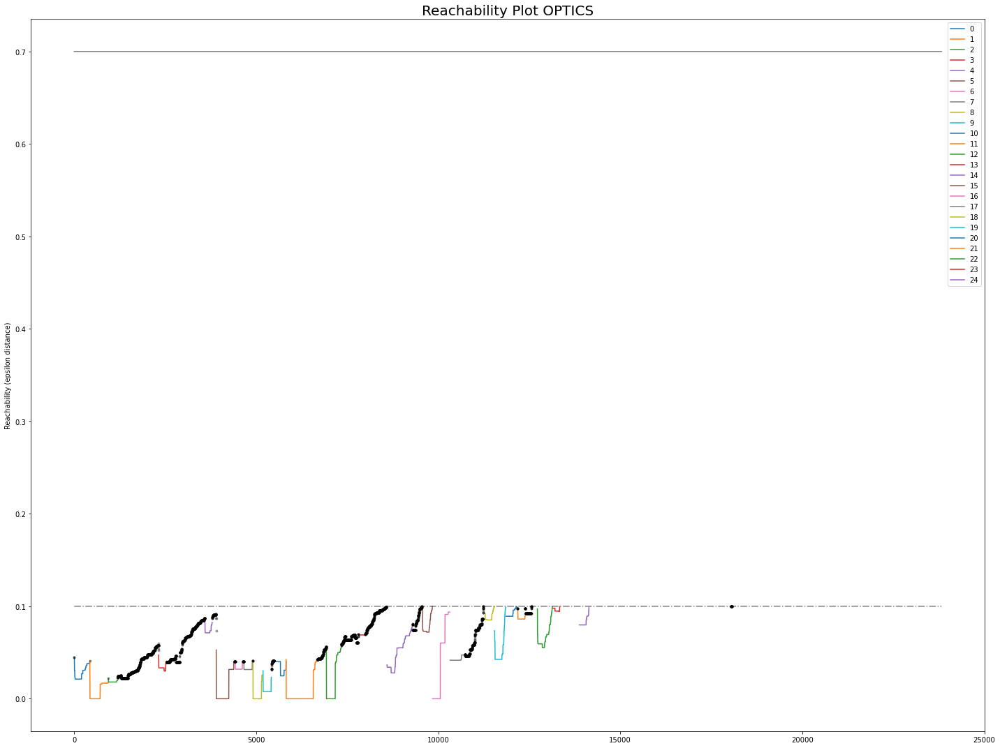

In [148]:
space = np.arange(len(scaled_data))
reachability = optics.reachability_[optics.ordering_]
labels = optics.labels_[optics.ordering_]

plt.figure(figsize=(20, 15)) # very bad plot coding, I did not adapt from subplot, but I have no time to fix it
G = gridspec.GridSpec(1, 1)
ax1 = plt.subplot(G[0, :])

# Reachability plot
klass_list = []
for klass in zip(range(0, nb_clusters+1)):
    Xk = space[labels == klass]
    Rk = reachability[labels == klass]
    ax1.plot(Xk, Rk)
    klass_list.append(klass[0])
ax1.legend(klass_list,loc="upper right")
ax1.plot(space[labels == -1], reachability[labels == -1], "k.", alpha=0.3)
ax1.plot(space, np.full_like(space, 0.7, dtype=float), "k-", alpha=0.5)
ax1.plot(space, np.full_like(space, 0.1, dtype=float), "k-.", alpha=0.5)
ax1.set_ylabel("Reachability (epsilon distance)")
ax1.set_title('Reachability Plot OPTICS', fontsize=20)
plt.tight_layout()

I set the max eps based on the results from the previous reachability curve (with DBSCAN algorithm).<br>
<br>
OPTICS identifies similar clusters in low density regions but inside the dense region cluster, it identify many small clusters.<br>
It would be better if we could set a min eps as well, so these very small clusters could be merged together

Should think about an alogithm which varies the eps but differently compared to OPTICS (?).<br>
Something that allows to set the minimum value for eps and not only the max value or that considers changing the min_samples depending on the "density" level we are (?)

It seems like HDBSCAN could be what I´m looking for.<br>
Let´s  try that as well

# HDBSCAN<a class="anchor" id="hdbscan"></a>

From documentation: HDBSCAN is a clustering algorithm developed by Campello, Moulavi, and Sander. It extends DBSCAN by converting it into a hierarchical clustering algorithm, and then using a technique to extract a flat clustering based in the stability of clusters

In [149]:
hdbscan = HDBSCAN(cluster_selection_epsilon = 0.1, min_cluster_size = 250, min_samples = 350)
hdbscan = hdbscan.fit(scaled_data)
data['cluster_group_HDBSCAN'] = hdbscan.labels_
nb_clusters = data['cluster_group_HDBSCAN'].max()

count   23824.00000
mean        3.37370
std         4.53397
min        -1.00000
25%        -1.00000
50%         1.00000
75%         7.00000
max        10.00000
Name: cluster_group_HDBSCAN, dtype: float64
Number of clusters=  11  + the "noise" cluster


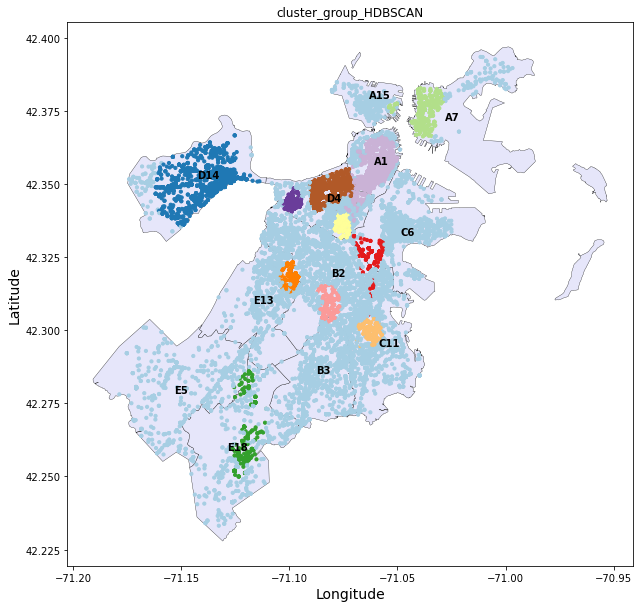

In [150]:
plot_cluster_info('cluster_group_HDBSCAN')
plot_clusters('cluster_group_HDBSCAN')
fig = plot_distr_map(df_L,g_dis)
plot_cluster_on_map('cluster_group_HDBSCAN')

This algorithm seems to identify some clusters similar to DBSCAN and OPTICS and none is too small.<br>
It fails in identify a specific areas in districts D14 and A7, and it misses an area in E13.<br>
Moreover some clusters seems to have points far away which it fails to identify as "outside" the cluster, like the cluster in E18

More insights on the specific parameters to use and change in the algorithm used could lead to improvement in the results.<br>

For a cluster specific evaluation purpose I have decided to use the results from DBSCAN

# Clusters Evaluation<a class="anchor" id="clusters_evaluation"></a>

Using such parameters for the models could lead to overfitting of the data, but in this case I´m not much worried about this since the paramters were actually tuned on the data to be able to explore them.<br>
Should the same algorithm be applied on a different dataset or even on a different type of crime, it must be tuned on those specific data.<br>
DBSCAN parameters should be tuned on the specific dataset anyway.<br>
<br>
I have a look at the cluster on the district map and analyse if they can make sense:

count   23824.00000
mean        0.53450
std         2.46622
min        -1.00000
25%        -1.00000
50%         0.00000
75%         1.00000
max        11.00000
Name: cluster_group_DBSCAN, dtype: float64
Number of clusters=  12  + the "noise" cluster


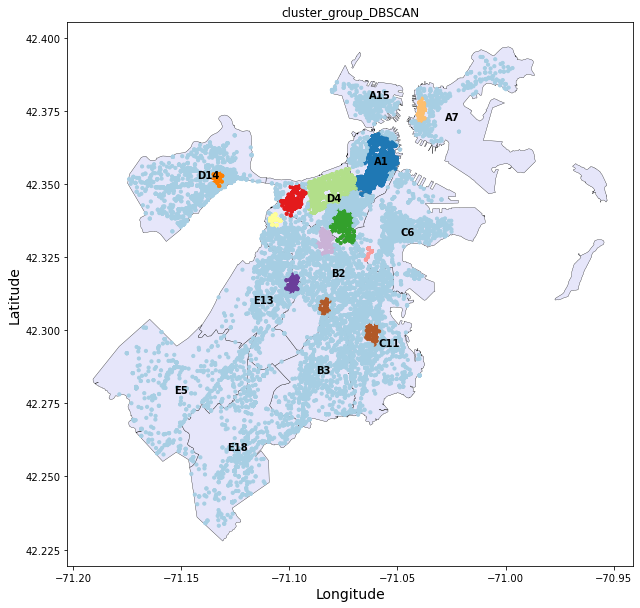

In [151]:
plot_cluster_info('cluster_group_DBSCAN')
plot_clusters('cluster_group_DBSCAN')
fig = plot_distr_map(df_L,g_dis)
plot_cluster_on_map('cluster_group_DBSCAN')

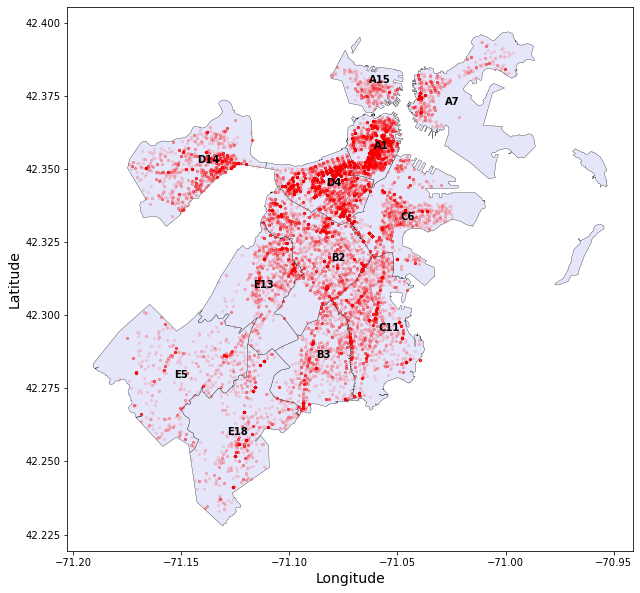

In [152]:
ax = plot_distr_map(df_L,g_dis)
#sns.jointplot(df_L.long, df_L.lat,ax = ax, kind='kde')
plt.scatter(df_L.long, df_L.lat, alpha=0.1, color = 'red', s = 5)

Let´s analyse each of the 12 clusters:

The first 2 clusters were clearly general areas where the rate of larceny was very high, so they are quite evident from the data

### Cluster 0: Downtown Boston

In [153]:
plot_cluster_heatmap('cluster_group_DBSCAN',0)

This is one of the 2 bigger clusters, which focus on Downton Boston as an area with high larceny rate

### Cluster 1: Boston Back Bay

In [154]:
plot_cluster_heatmap('cluster_group_DBSCAN',1)

Now the smaller clusters, we have to check if they can make sense

### Cluster 2: Boston Medical Center

Still in a high rate area, it can make sense to have a cluster of larcenies around an hospital

In [155]:
plot_cluster_heatmap('cluster_group_DBSCAN',2)

### Cluster 3: South Bay Center - Newmarket Station

Cluster 3 is a very small cluster, but it makes sense to have a high larceny rate in a mall closed to a train station

In [156]:
plot_cluster_heatmap('cluster_group_DBSCAN',3, radius = 30)

### Cluster 4: Fenway-Kenmore

A cluster still in the very high rate area, around the baseball stadium area

In [157]:
plot_cluster_heatmap('cluster_group_DBSCAN',4)

### Cluster 5: East Boston Central Square


A cluster in a low larceny rate area, near a commercial area

In [158]:
plot_cluster_heatmap('cluster_group_DBSCAN',5)

### Cluster 6: Brighton-Harvard Avenue Crossroad

It´s around some big crossroads and commercial area, could be meaningful but not clear.<br>
Maybe HDBSCAN was doing a better job identifying a broader area instead

In [159]:
plot_cluster_heatmap('cluster_group_DBSCAN',6, radius = 30)

### Cluster 7: Bruce C. Bolling Municipal Building

Around Bruce C. Bolling Municipal Building, there is a  bus station in front of it.<br>

In [160]:
plot_cluster_heatmap('cluster_group_DBSCAN',7)

### Cluster 8: Columbus Avenue-Washington Street

Big crossroad and commercial area with church<br>

In [161]:
plot_cluster_heatmap('cluster_group_DBSCAN',8)

### Cluster 9: Harvard Medical School

Around Harvard Medical School and the hospital, makes sense.

In [162]:
plot_cluster_heatmap('cluster_group_DBSCAN',9, radius = 30)

### Cluster 10: Fields Corner commercial area

Commercial area, closed to a station

In [163]:
plot_cluster_heatmap('cluster_group_DBSCAN', 10, radius = 30)

### Cluster 11: Warren Street - Blue Hill Avenue Crossroad

Commercial area with bank, supermarket, a big crossroad

In [164]:
plot_cluster_heatmap('cluster_group_DBSCAN',11, radius = 30)

# Final comments<a class="anchor" id="final_comments"></a>

It seems the model can identify some specific areas with high larceny rates, even in low larceny rate neighbourhoods, around some commercial areas, malls, school, hospitals which makes sense.<br>
The results look reasonable, we should know more about the areas and the city to completly evaluate them.<br>

 I could try to apply it to another type of crime i.e. Drug Violations, adapt the parameters and see around which areas another type of crime seems to have some high rate areas